Code for the SI manuscript:
### Quantifying urban socio-economic segregation through co-residence network reconstruction
Doi: https://doi.org/10.48550/arXiv.2501.15920

In [1]:
# `conda install watermark`
%load_ext watermark
%watermark

Last updated: 2025-06-01T18:56:20.138569+02:00

Python implementation: CPython
Python version       : 3.10.6
IPython version      : 7.33.0

Compiler    : MSC v.1929 64 bit (AMD64)
OS          : Windows
Release     : 10
Machine     : AMD64
Processor   : Intel64 Family 6 Model 142 Stepping 11, GenuineIntel
CPU cores   : 8
Architecture: 64bit



Importing all libraries needed

In [2]:
import os
os.environ["OMP_NUM_THREADS"] = '1'

In [3]:
# Core libraries for data handling and numerical operations
import pandas as pd
import numpy as np

In [4]:
# Basic plotting tools and configuration
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.ticker import FuncFormatter, LogFormatter
from matplotlib.colors import LogNorm, ListedColormap
from matplotlib.patches import Rectangle
from matplotlib import cm
from matplotlib.cm import ScalarMappable
import matplotlib.patheffects as PathEffects

# Close any existing figures and set inline plotting
plt.close("all")
%matplotlib inline

In [5]:
# Additional visualization libraries
import seaborn as sns
from adjustText import adjust_text

In [6]:
# Libraries for working with geospatial data and plots
import geopandas as gpd
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [7]:
# Clean imports for spatial and statistical analysis (without deprecation warnings)

import warnings

# Filter known, non-critical warnings
from numba.core.errors import NumbaDeprecationWarning
warnings.filterwarnings("ignore", category=NumbaDeprecationWarning)
warnings.filterwarnings("ignore", message="The 'nopython' keyword argument was not supplied")
warnings.filterwarnings("ignore", message="The next major release of pysal/spaghetti")

# Libraries for spatial inequality and statistical testing
from pysal.explore import inequality
from scipy import stats

In [8]:
# Machine learning libraries for clustering analysis
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [9]:
# Interactive plotting with Plotly
import plotly.graph_objects as go

In [10]:
#Display all columns in pandas DataFrame
pd.set_option('display.max_columns', None)

#### Reading the original Dataset of migrants living in Vienna at 22/09/2023 - 19 TOP countries + Others
Source: Austrian Goverment

In [11]:
migrants = pd.read_csv("Datasets/Vienna_22_09_2023_others.csv")
migrants.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 460 entries, 0 to 459
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Postal_Code         460 non-null    int64 
 1   District            460 non-null    object
 2   Total_Per_District  460 non-null    int64 
 3   Country_Name        460 non-null    object
dtypes: int64(2), object(2)
memory usage: 14.5+ KB


#### Reading the Vienna json file - 23 Districts
Source: https://www.data.gv.at/katalog/dataset/2ee6b8bf-6292-413c-bb8b-bd22dbb2ad4b

In [12]:
vienna = gpd.read_file("Datasets/vienna.json")
vienna.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 23 entries, 0 to 22
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   NAMEK                 23 non-null     object  
 1   BEZNR                 23 non-null     int64   
 2   DISTRICT_CODE         23 non-null     int64   
 3   STATAUSTRIA_BEZ_CODE  23 non-null     int64   
 4   STATAUSTRIA_GEM_CODE  23 non-null     int64   
 5   geometry              23 non-null     geometry
dtypes: geometry(1), int64(4), object(1)
memory usage: 1.2+ KB


#### Reading the total population in Vienna Districts filtered for 2023
Source: https://www.data.gv.at/katalog/dataset/091a085f-2652-429f-8dde-c69199440ddf

In [13]:
population2023=pd.read_csv("Datasets/population2023.csv")
population2023.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23 entries, 0 to 22
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   POP_TOTAL    23 non-null     int64  
 1   POP_MAL      23 non-null     float64
 2   POP_FEM      23 non-null     float64
 3   Postal_Code  23 non-null     int64  
dtypes: float64(2), int64(2)
memory usage: 864.0 bytes


#### Reading the preprocessed Dataset of migrants and Austrians generated in the Main code.

In [14]:
migrants_austrians=pd.read_csv("Datasets/migrants_austrians.csv")
migrants_austrians.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 483 entries, 0 to 482
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Postal_Code         483 non-null    int64 
 1   District            483 non-null    object
 2   Total_Per_District  483 non-null    int64 
 3   Country_Name        483 non-null    object
dtypes: int64(2), object(2)
memory usage: 15.2+ KB


#### Reading the income in Vienna Districts filtered for 2020
Source: https://www.data.gv.at/katalog/dataset/8f405794-d95b-4d12-922a-850045bb6870

In [15]:
income2020 = pd.read_csv("Datasets/income2020.csv")
income2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23 entries, 0 to 22
Data columns (total 14 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   GROSSINCOME_TOTAL                           23 non-null     object 
 1   GROSSINCOME_MEN                             23 non-null     object 
 2   GROSSINCOME_WOMEN                           23 non-null     object 
 3   AVERAGE_GROSSINCOME_TOTAL                   23 non-null     float64
 4   AVERAGE_GROSSINCOME_MEN                     23 non-null     float64
 5   AVERAGE_GROSSINCOME_WOMEN                   23 non-null     float64
 6   AVERAGE_NETINCOME_TOTAL                     23 non-null     float64
 7   AVERAGE_NETINCOME_MEN                       23 non-null     float64
 8   AVERAGE_NETINCOME_WOMEN                     23 non-null     float64
 9   AVERAGE_NETINCOME_FULLTIME_WHOLEYEAR_TOTAL  23 non-null     float64
 10  AVERAGE_NETINCOM

#### Reading the Rental price in Vienna Districts
Source: https://www.virtualvienna.net/moving-to-vienna/accommodation-in-vienna/real-estate-rental-prices/
derstandard.at

In [16]:
rentalprice = pd.read_csv("Datasets/rentalpriceVienna.csv")
rentalprice['AVERAGE/M²'] = rentalprice['AVERAGE/M²'].str.replace(',', '.').astype(float)
rentalprice.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23 entries, 0 to 22
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DISTRICT     23 non-null     object 
 1   <50 M²       23 non-null     object 
 2   51-80 M²     23 non-null     object 
 3   51-129 M²    23 non-null     object 
 4   >130 M²      23 non-null     object 
 5   AVERAGE/M²   23 non-null     float64
 6   Postal_Code  23 non-null     int64  
dtypes: float64(1), int64(1), object(5)
memory usage: 1.4+ KB


#### Reading median income for many countries
Source: https://worldpopulationreview.com/country-rankings/median-income-by-country

In [17]:
medianincomecountries = pd.read_csv("Datasets/median-income-by-country-2024.csv")
medianincomecountries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 161 entries, 0 to 160
Data columns (total 21 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   place                                  161 non-null    int64  
 1   pop2024                                161 non-null    float64
 2   growthRate                             161 non-null    float64
 3   area                                   161 non-null    int64  
 4   country                                161 non-null    object 
 5   cca3                                   161 non-null    object 
 6   cca2                                   160 non-null    object 
 7   ccn3                                   161 non-null    int64  
 8   region                                 161 non-null    object 
 9   subregion                              161 non-null    object 
 10  unMember                               161 non-null    bool   
 11  offici

#### Reading the World map json file
Source: https://geojson-maps.ash.ms/

In [18]:
world = gpd.read_file("Datasets/world.json")
world.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 175 entries, 0 to 174
Columns: 170 entries, featurecla to geometry
dtypes: float64(6), geometry(1), int64(25), object(138)
memory usage: 232.5+ KB


### Figure S1
Demographics of Vienna across citizenship categories

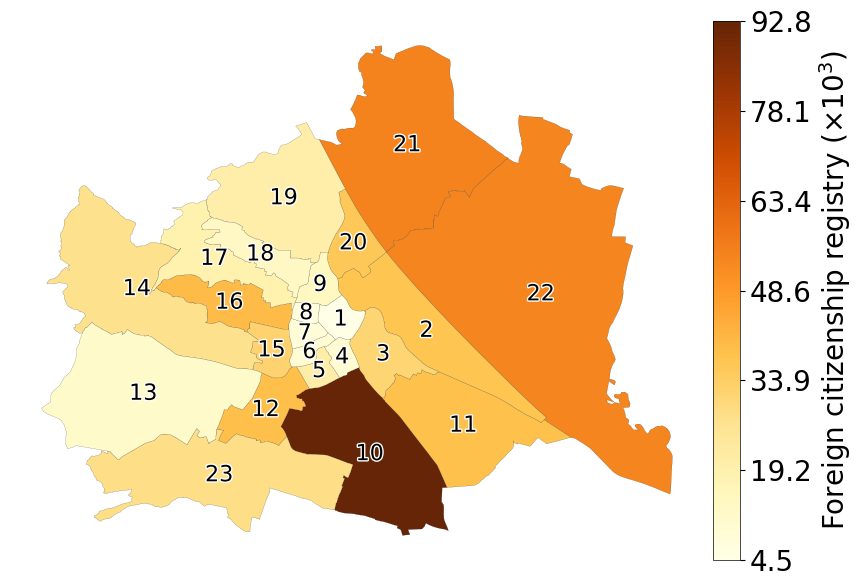

In [19]:
df_grouped_total_per_district = migrants.groupby(["Postal_Code"],as_index=True).Total_Per_District.sum()
vienna_total_per_district = vienna.merge(df_grouped_total_per_district, left_on="DISTRICT_CODE", right_on="Postal_Code").sort_values(by='Total_Per_District', ascending=False)

# Create a larger figure with a constant colorbar size
fig, ax = plt.subplots(figsize=(12, 7))  # Adjust the figsize values as needed
# Plotting the GeoPandas DataFrame
cax = vienna_total_per_district.plot("Total_Per_District", legend=False, cmap='YlOrBr', edgecolor='black', linewidth=0.1, ax=ax)

# Remove the axes
ax.set_axis_off()

# Add colorbar on the right
cbar = plt.colorbar(cax.get_children()[0], ax=ax, orientation='vertical', pad=0.01, format=FuncFormatter(lambda x, _: f"{x / 1e3:.0f}"))
cbar.outline.set_linewidth(0.5)  # Adjust the linewidth as needed
# Increase the font size of colorbar labels
cbar.ax.tick_params(axis='y', labelsize=20)  # Adjust the labelsize as needed

# Calculate the ticks based on the logarithmic scale
lin_ticks = np.linspace(vienna_total_per_district["Total_Per_District"].min(), vienna_total_per_district["Total_Per_District"].max(), num=7)
cbar.set_ticks(lin_ticks)
#cbar.set_ticklabels(["{:.1f}".format(tick) for tick in lin_ticks])  # Format tick labels in scientific notation
cbar.set_ticklabels([f"{tick / 1e3:.1f}" for tick in lin_ticks])
# Add label to the colorbar
cbar.set_label(r'Foreign citizenship registry ($\times 10^3$)', fontsize=20)  # Adjust the label text and fontsize as needed
# Annotate each polygon with another column value (e.g., district number or name)
for idx, row in vienna_total_per_district.iterrows():
    centroid = row.geometry.centroid
    name = row['BEZNR']  # Replace 'BEZNR' with the actual column name representing the district name or number
    
    text = ax.text(
        centroid.x, centroid.y, name, 
        fontsize=16, ha='center', va='center', color='black'  # Set text color to white
    )
    
    # Add black outline to the text
    text.set_path_effects([
        PathEffects.withStroke(linewidth=2, foreground='white')  # Black outline
    ])

plt.savefig("Figures/SI/S1a.pdf", bbox_inches='tight', pad_inches=0.2)

plt.show()

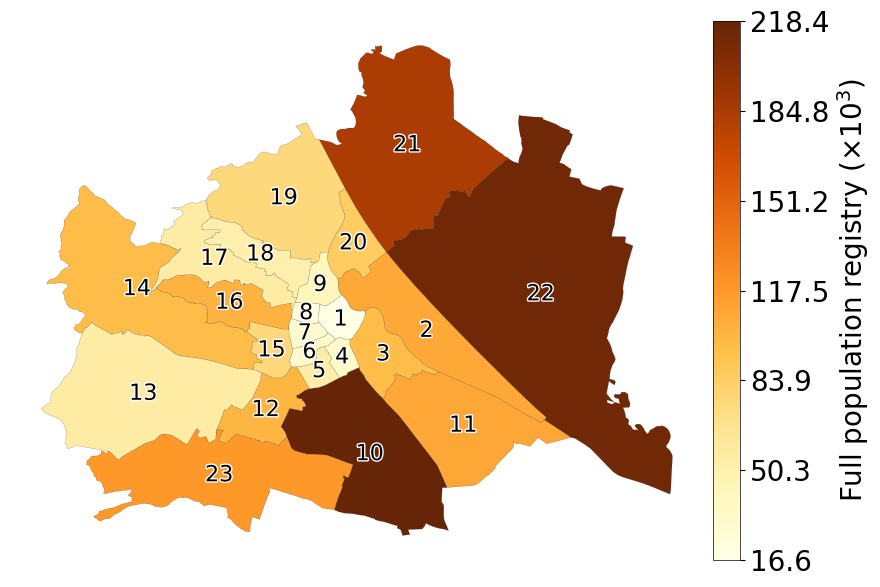

In [20]:
df_grouped_total_per_district_aus = migrants_austrians.groupby(["Postal_Code"],as_index=True).Total_Per_District.sum()
vienna_total_per_district_tot = vienna.merge(df_grouped_total_per_district_aus, left_on="DISTRICT_CODE", right_on="Postal_Code").sort_values(by='Total_Per_District', ascending=False)

# Create a larger figure with a constant colorbar size
fig, ax = plt.subplots(figsize=(12, 7))  # Adjust the figsize values as needed
# Plotting the GeoPandas DataFrame
cax = vienna_total_per_district_tot.plot("Total_Per_District", legend=False, cmap='YlOrBr', edgecolor='black', linewidth=0.1, ax=ax)

# Remove the axes
ax.set_axis_off()

# Add colorbar on the right
cbar = plt.colorbar(cax.get_children()[0], ax=ax, orientation='vertical', pad=0.01, format=FuncFormatter(lambda x, _: f"{x / 1e3:.0f}"))
cbar.outline.set_linewidth(0.5)  # Adjust the linewidth as needed

cbar.ax.tick_params(axis='y', labelsize=20)  # Adjust the labelsize as needed

# Calculate the ticks based on the logarithmic scale
lin_ticks = np.linspace(vienna_total_per_district_tot["Total_Per_District"].min(), vienna_total_per_district_tot["Total_Per_District"].max(), num=7)
cbar.set_ticks(lin_ticks)
#cbar.set_ticklabels(["{:.1f}".format(tick) for tick in lin_ticks])  # Format tick labels in scientific notation
cbar.set_ticklabels([f"{tick / 1e3:.1f}" for tick in lin_ticks])
# Add label to the colorbar
cbar.set_label(r'Full population registry ($\times 10^3$)', fontsize=20)  # Adjust the label text and fontsize as needed
# Annotate each polygon with another column value (e.g., district number or name)
for idx, row in vienna_total_per_district_tot.iterrows():
    centroid = row.geometry.centroid
    name = row['BEZNR']  # Replace 'BEZNR' with the actual column name representing the district name or number
    
    text = ax.text(
        centroid.x, centroid.y, name, 
        fontsize=16, ha='center', va='center', color='black'  # Set text color to white
    )
    
    # Add black outline to the text
    text.set_path_effects([
        PathEffects.withStroke(linewidth=2, foreground='white')  # Black outline
    ])

plt.savefig("Figures/SI/S1b.pdf", bbox_inches='tight', pad_inches=0.2)

plt.show()

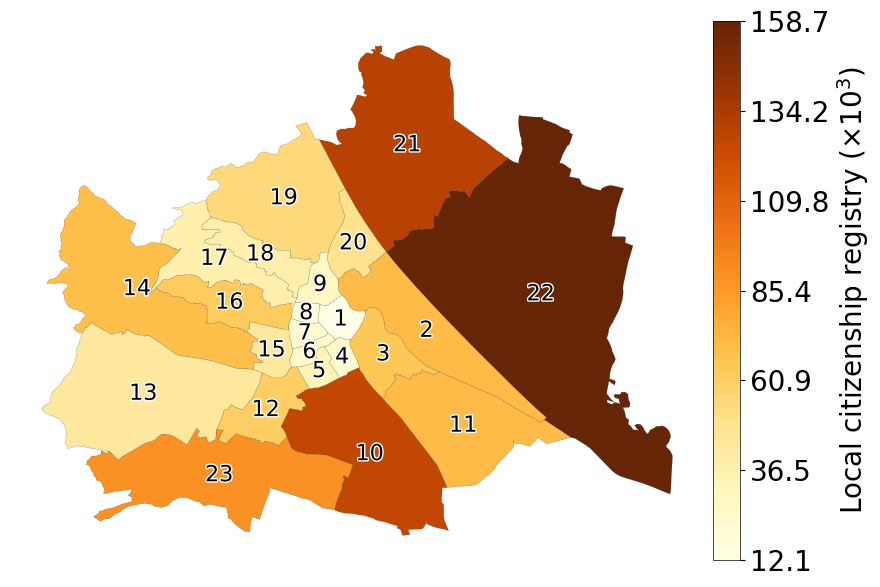

In [21]:
total_aus = migrants_austrians[migrants_austrians['Country_Name']=="Austria"]
vienna_total_per_district_aus = vienna.merge(total_aus, left_on="DISTRICT_CODE", right_on="Postal_Code").sort_values(by='Total_Per_District', ascending=False)

# Create a larger figure with a constant colorbar size
fig, ax = plt.subplots(figsize=(12, 7))  # Adjust the figsize values as needed
# Plotting the GeoPandas DataFrame
cax=vienna_total_per_district_aus.plot("Total_Per_District", legend=False, cmap='YlOrBr', edgecolor='black', linewidth=0.1, ax=ax)

# Remove the axes
ax.set_axis_off()

# Add colorbar on the right
cbar = plt.colorbar(cax.get_children()[0], ax=ax, orientation='vertical', pad=0.01, format=FuncFormatter(lambda x, _: f"{x / 1e3:.0f}"))
cbar.outline.set_linewidth(0.5)  # Adjust the linewidth as needed
# Increase the font size of colorbar labels
cbar.ax.tick_params(axis='y', labelsize=20)  # Adjust the labelsize as needed

# Calculate the ticks based on the logarithmic scale
lin_ticks = np.linspace(vienna_total_per_district_aus["Total_Per_District"].min(), vienna_total_per_district_aus["Total_Per_District"].max(), num=7)
cbar.set_ticks(lin_ticks)
#cbar.set_ticklabels(["{:.1f}".format(tick) for tick in lin_ticks])  # Format tick labels in scientific notation
cbar.set_ticklabels([f"{tick / 1e3:.1f}" for tick in lin_ticks])
# Add label to the colorbar
cbar.set_label(r'Local citizenship registry ($\times 10^3$)', fontsize=20)  # Adjust the label text and fontsize as needed
# Annotate each polygon with another column value (e.g., district number or name)
for idx, row in vienna_total_per_district_aus.iterrows():
    centroid = row.geometry.centroid
    name = row['BEZNR']  # Replace 'BEZNR' with the actual column name representing the district name or number
    
    text = ax.text(
        centroid.x, centroid.y, name, 
        fontsize=16, ha='center', va='center', color='black'  # Set text color to white
    )
    
    # Add black outline to the text
    text.set_path_effects([
        PathEffects.withStroke(linewidth=2, foreground='white')  # Black outline
    ])

plt.savefig("Figures/SI/S1c.pdf", bbox_inches='tight', pad_inches=0.2)

plt.show()

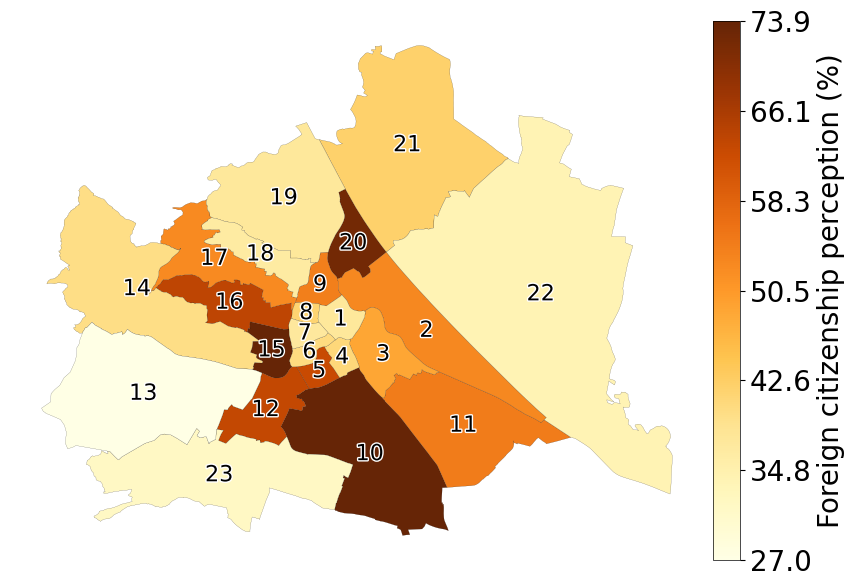

In [22]:
df_grouped_total_aus = total_aus.groupby(["Postal_Code"],as_index=True).Total_Per_District.sum()
percentage_aus = (df_grouped_total_per_district / df_grouped_total_aus) * 100
percentage = (df_grouped_total_per_district / df_grouped_total_per_district_aus) * 100
vienna_total_per_district_per = vienna.merge(percentage_aus, left_on="DISTRICT_CODE", right_on="Postal_Code").sort_values(by='Total_Per_District', ascending=False)

# Create a larger figure with a constant colorbar size
fig, ax = plt.subplots(figsize=(12, 7))  # Adjust the figsize values as needed
# Plotting the GeoPandas DataFrame
cax=vienna_total_per_district_per.plot("Total_Per_District", legend=False, cmap='YlOrBr', edgecolor='black', linewidth=0.1, ax=ax)

# Remove the axes
ax.set_axis_off()

# Add colorbar on the right
cbar = plt.colorbar(cax.get_children()[0], ax=ax, orientation='vertical', pad=0.01)#, format=FuncFormatter(lambda x, _: f"{x / 1e4:.0f}"))
cbar.outline.set_linewidth(0.5)  # Adjust the linewidth as needed
# Increase the font size of colorbar labels
cbar.ax.tick_params(axis='y', labelsize=20)  # Adjust the labelsize as needed

# Calculate the ticks based on the logarithmic scale
lin_ticks = np.linspace(vienna_total_per_district_per["Total_Per_District"].min(), vienna_total_per_district_per["Total_Per_District"].max(), num=7)
cbar.set_ticks(lin_ticks)
cbar.set_ticklabels(["{:.1f}".format(tick) for tick in lin_ticks])  # Format tick labels in scientific notation
# Add label to the colorbar
cbar.set_label(r'Foreign citizenship perception (%)', fontsize=20)  # Adjust the label text and fontsize as needed
# Annotate each polygon with another column value (e.g., district number or name)
for idx, row in vienna_total_per_district_aus.iterrows():
    centroid = row.geometry.centroid
    name = row['BEZNR']  # Replace 'BEZNR' with the actual column name representing the district name or number
    
    text = ax.text(
        centroid.x, centroid.y, name, 
        fontsize=16, ha='center', va='center', color='black'  # Set text color to white
    )
    
    # Add black outline to the text
    text.set_path_effects([
        PathEffects.withStroke(linewidth=2, foreground='white')  # Black outline
    ])

plt.savefig("Figures/SI/S1d.pdf", bbox_inches='tight', pad_inches=0.2)

plt.show()

### Table S1
District-Level citizenship data

In [23]:
# Convert all Series to DataFrame
df1 = df_grouped_total_per_district_aus.reset_index()
df2 = df_grouped_total_per_district.reset_index()
df3 = df_grouped_total_aus.reset_index()
df4 = percentage_aus.reset_index()
df5 = percentage.reset_index()

# Rename columns before merging
df1 = df1.rename(columns={'Total_Per_District': 'Full population registry'})
df2 = df2.rename(columns={'Total_Per_District': 'Foreign citizenship registry'})
df3 = df3.rename(columns={'Total_Per_District': 'Local citizenship registry'})
df4 = df4.rename(columns={'Total_Per_District': 'Ratio Migrants/Locals'})
df5 = df5.rename(columns={'Total_Per_District': 'Percentage of Foreign citizenship'})

# Sequentially merge all DataFrames on the common key
tabs2 = df1.merge(df2, on="Postal_Code", how="outer") \
               .merge(df3, on="Postal_Code", how="outer") \
               .merge(df4, on="Postal_Code", how="outer") \
               .merge(df5, on="Postal_Code", how="outer")

# Sort by the percentage column in descending order
sorted_df = tabs2.sort_values(by="Percentage of Foreign citizenship", ascending=False)
sorted_df.iloc[:, -2:] = sorted_df.iloc[:, -2:].applymap(lambda x: f"{x:.2f}")
# Display or save the final DataFrame
print(sorted_df.to_string(index=False))
#sorted_df.to_clipboard(index=False)

 Postal_Code  Full population registry  Foreign citizenship registry  Local citizenship registry Ratio Migrants/Locals Percentage of Foreign citizenship
        1150                     76109                         32349                       43760                 73.92                             42.50
        1100                    218415                         92767                      125648                 73.83                             42.47
        1200                     85690                         35997                       49693                 72.44                             42.01
        1160                    102444                         39854                       62590                 63.67                             38.90
        1120                    100281                         38806                       61475                 63.12                             38.70
        1050                     55018                         21203              

### Figure S2
Average net Income and Rental prices in Vienna districts

In [24]:
income_rental = vienna.merge(income2020, left_on="DISTRICT_CODE", right_on="Postal_Code")
income_rental = income_rental.merge(rentalprice, left_on="DISTRICT_CODE", right_on="Postal_Code")

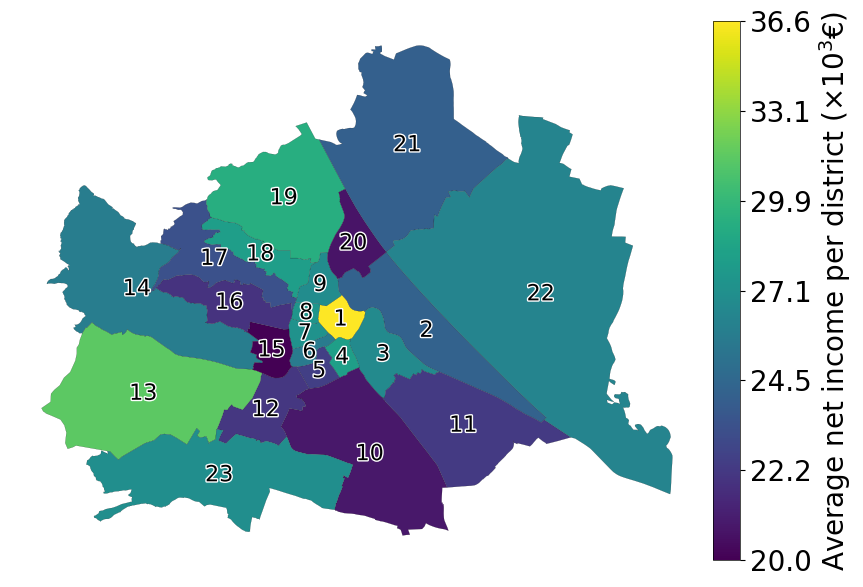

In [25]:
# Extract the data values
data_values = income_rental["AVERAGE_NETINCOME_TOTAL"].values

# Create a larger figure with a constant colorbar size
fig, ax = plt.subplots(figsize=(12, 7))  # Adjust the figsize values as needed

# Create color normalization based on log scale
norm = LogNorm(vmin=np.min(data_values), vmax=np.max(data_values))

# Plotting the GeoPandas DataFrame using log normalization on the color scale
# We map the color based on the logarithmic normalization
cax = income_rental.plot(
    "AVERAGE_NETINCOME_TOTAL", 
    legend=False, 
    edgecolor='black', 
    linewidth=0.1, 
    ax=ax, 
    cmap='viridis',  # Set a colormap
    norm=norm  # Apply log normalization
)

# Remove the axes
ax.set_axis_off()

# Create the ScalarMappable for the colorbar using the same log normalization
sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm._A = []  # Empty array for ScalarMappable

# Add colorbar on the right with logarithmic normalization
cbar = plt.colorbar(sm, ax=ax, orientation='vertical', pad=0.01, format=LogFormatter(10, labelOnlyBase=False))
cbar.outline.set_linewidth(0.5)  # Adjust the linewidth as needed

# Increase the font size of colorbar labels
cbar.ax.tick_params(axis='y', labelsize=20)  # Adjust the labelsize as needed

# Calculate the ticks based on the logarithmic scale
log_ticks = np.logspace(np.log10(np.min(data_values)), np.log10(np.max(data_values)), num=7)
cbar.set_ticks(log_ticks)
cbar.set_ticklabels(["{:.1f}".format(tick) for tick in log_ticks])  # Format tick labels in scientific notation

# Hide the minor ticks to make sure default ticks don't appear
cbar.ax.minorticks_off()  # Ensure no minor ticks are shown
# Add label to the colorbar
cbar.set_label(r'Average net income per district ($\times 10^3 €$)', fontsize=20)  # Adjust the label text and fontsize as needed
# Annotate each polygon with another column value (e.g., district number or name)
for idx, row in income_rental.iterrows():
    centroid = row.geometry.centroid
    name = row['BEZNR']  # Replace 'BEZNR' with the actual column name representing the district name or number
    
    text = ax.text(
        centroid.x, centroid.y, name, 
        fontsize=16, ha='center', va='center', color='black'  # Set text color to white
    )
    
    # Add black outline to the text
    text.set_path_effects([
        PathEffects.withStroke(linewidth=2, foreground='white')  # Black outline
    ])

# Save the plot
plt.savefig("Figures/SI/S2a.pdf", bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\1993846365.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis_colormap = cm.get_cmap('viridis')
C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\1993846365.py:67: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles=legend.legendHandles,  # Reuse the original legend handles


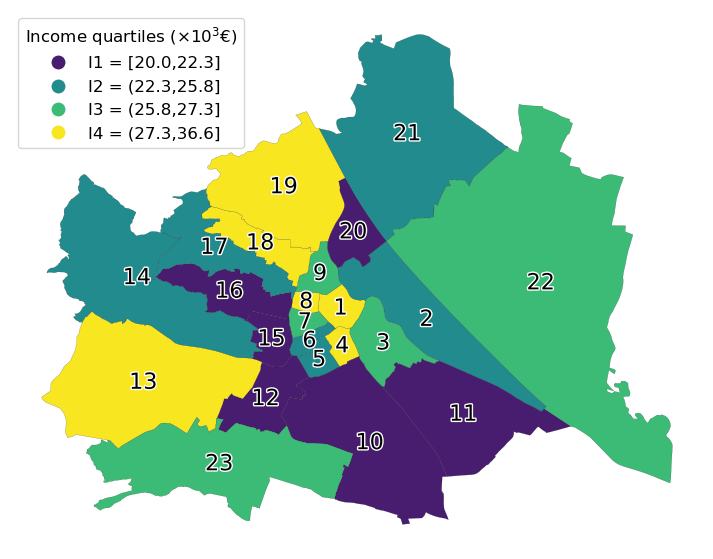

In [26]:
# Define the viridis colormap
viridis_colormap = cm.get_cmap('viridis')
# Choose specific values in the viridis colormap for purples and yellows
purple_color = viridis_colormap(0.08)
blue_color = viridis_colormap(0.48)
green_color = viridis_colormap(0.68)
yellow_color = viridis_colormap(0.99)
# Define your custom colors
qcolors = [purple_color, blue_color, green_color, yellow_color]

# Create a colormap
custom_cmap = ListedColormap(qcolors)

# Extract the data values
data_values = income_rental["AVERAGE_NETINCOME_TOTAL"].values

# Calculate quantiles manually
quantiles = np.percentile(data_values, [0, 25, 50, 75, 100])  # Compute the quantile ranges (Q1-Q4)

# Create a larger figure with a constant colorbar size
fig, ax = plt.subplots(figsize=(12, 7))  # Adjust the figsize values as needed

# Plotting the GeoPandas DataFrame using quantiles
cax = income_rental.plot(
    "AVERAGE_NETINCOME_TOTAL", 
    legend=True, 
    edgecolor='black', 
    linewidth=0.1, 
    ax=ax,
    cmap=custom_cmap,
    scheme="quantiles", 
    k=4
)

# Remove the axes
ax.set_axis_off()

# Annotate each polygon with another column value (e.g., district number or name)
for idx, row in income_rental.iterrows():
    centroid = row.geometry.centroid
    name = row['BEZNR']  # Replace 'BEZNR' with the actual column name representing the district name or number
    
    text = ax.text(
        centroid.x, centroid.y, name, 
        fontsize=16, ha='center', va='center', color='black'
    )
    
    # Add white outline to the text
    text.set_path_effects([
        PathEffects.withStroke(linewidth=2, foreground='white')
    ])

# Customize the legend with manual quantile labels
legend = ax.get_legend()  # Get the original legend

# Custom labels for the quartiles
labels = [
    f"I1 = [{quantiles[0]:.1f},{quantiles[1]:.1f}]",
    f"I2 = ({quantiles[1]:.1f},{quantiles[2]:.1f}]",
    f"I3 = ({quantiles[2]:.1f},{quantiles[3]:.1f}]",
    f"I4 = ({quantiles[3]:.1f},{quantiles[4]:.1f}]"
]

# Replace the legend
legend.remove()
custom_legend = ax.legend(
    handles=legend.legendHandles,  # Reuse the original legend handles
    labels=labels,
    loc="upper left",  # Adjust position as needed
    title=r'Income quartiles ($\times 10^3 €$)',
    fontsize=12,  # Enlarge font size for legend text
    title_fontsize=12,  # Enlarge font size for legend title
    frameon=True  # Add a frame around the legend
)

# Save the plot
plt.savefig("Figures/SI/S2b.pdf", bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()

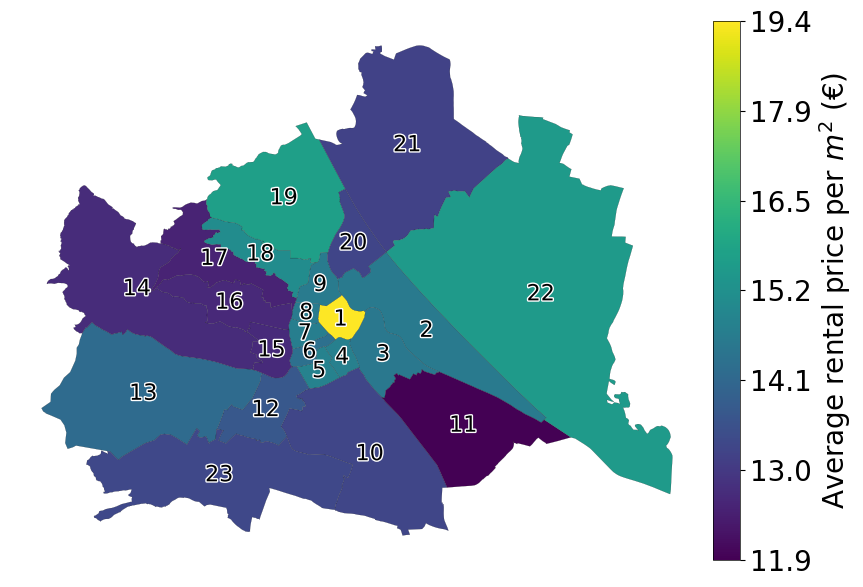

In [27]:
# Extract the data values
data_values = income_rental['AVERAGE/M²'].values

# Create a larger figure with a constant colorbar size
fig, ax = plt.subplots(figsize=(12, 7))  # Adjust the figsize values as needed

# Create color normalization based on log scale
norm = LogNorm(vmin=np.min(data_values), vmax=np.max(data_values))

# Plotting the GeoPandas DataFrame using log normalization on the color scale
# We map the color based on the logarithmic normalization
cax = income_rental.plot(
    'AVERAGE/M²', 
    legend=False, 
    edgecolor='black', 
    linewidth=0.1, 
    ax=ax, 
    cmap='viridis',  # Set a colormap
    norm=norm  # Apply log normalization
)

# Remove the axes
ax.set_axis_off()

# Create the ScalarMappable for the colorbar using the same log normalization
sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm._A = []  # Empty array for ScalarMappable

# Add colorbar on the right with logarithmic normalization
cbar = plt.colorbar(sm, ax=ax, orientation='vertical', pad=0.01, format=LogFormatter(10, labelOnlyBase=False))
cbar.outline.set_linewidth(0.5)  # Adjust the linewidth as needed

# Increase the font size of colorbar labels
cbar.ax.tick_params(axis='y', labelsize=20)  # Adjust the labelsize as needed

# Calculate the ticks based on the logarithmic scale
log_ticks = np.logspace(np.log10(np.min(data_values)), np.log10(np.max(data_values)), num=7)
cbar.set_ticks(log_ticks)
cbar.set_ticklabels(["{:.1f}".format(tick) for tick in log_ticks])  # Format tick labels in scientific notation

# Hide the minor ticks to make sure default ticks don't appear
cbar.ax.minorticks_off()  # Ensure no minor ticks are shown

# Add label to the colorbar
cbar.set_label(r'Average rental price per $m^2$ ($€$)', fontsize=20)  # Adjust the label text and fontsize as needed
# Annotate each polygon with another column value (e.g., district number or name)
for idx, row in income_rental.iterrows():
    centroid = row.geometry.centroid
    name = row['BEZNR']  # Replace 'BEZNR' with the actual column name representing the district name or number
    
    text = ax.text(
        centroid.x, centroid.y, name, 
        fontsize=16, ha='center', va='center', color='black'  # Set text color to white
    )
    
    # Add black outline to the text
    text.set_path_effects([
        PathEffects.withStroke(linewidth=2, foreground='white')  # Black outline
    ])

# Save the plot
plt.savefig("Figures/SI/S2c.pdf", bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\3775181391.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis_colormap = cm.get_cmap('viridis')
C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\3775181391.py:67: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles=legend.legendHandles,  # Reuse the original legend handles


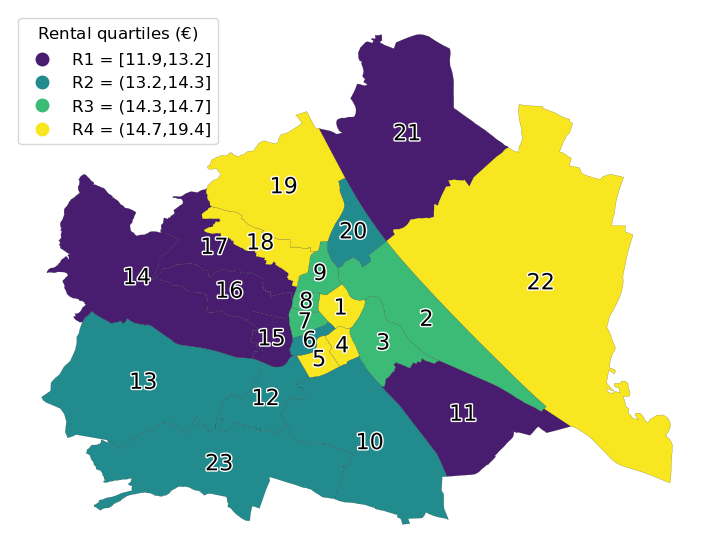

In [28]:
# Define the viridis colormap
viridis_colormap = cm.get_cmap('viridis')
# Choose specific values in the viridis colormap for purples and yellows
purple_color = viridis_colormap(0.08)
blue_color = viridis_colormap(0.48)
green_color = viridis_colormap(0.68)
yellow_color = viridis_colormap(0.99)
# Define your custom colors
qcolors = [purple_color, blue_color, green_color, yellow_color]

# Create a colormap
custom_cmap = ListedColormap(qcolors)

# Extract the data values
data_values = income_rental['AVERAGE/M²'].values

# Calculate quantiles manually
quantiles = np.percentile(data_values, [0, 25, 50, 75, 100])  # Compute the quantile ranges (Q1-Q4)

# Create a larger figure with a constant colorbar size
fig, ax = plt.subplots(figsize=(12, 7))  # Adjust the figsize values as needed

# Plotting the GeoPandas DataFrame using quantiles
cax = income_rental.plot(
    'AVERAGE/M²', 
    legend=True, 
    edgecolor='black', 
    linewidth=0.1, 
    ax=ax, 
    cmap=custom_cmap,  # Set a colormap
    scheme="quantiles", 
    k=4
)

# Remove the axes
ax.set_axis_off()

# Annotate each polygon with another column value (e.g., district number or name)
for idx, row in income_rental.iterrows():
    centroid = row.geometry.centroid
    name = row['BEZNR']  # Replace 'BEZNR' with the actual column name representing the district name or number
    
    text = ax.text(
        centroid.x, centroid.y, name, 
        fontsize=16, ha='center', va='center', color='black'
    )
    
    # Add white outline to the text
    text.set_path_effects([
        PathEffects.withStroke(linewidth=2, foreground='white')
    ])

# Customize the legend with manual quantile labels
legend = ax.get_legend()  # Get the original legend

# Custom labels for the quartiles
labels = [
    f"R1 = [{quantiles[0]:.1f},{quantiles[1]:.1f}]",
    f"R2 = ({quantiles[1]:.1f},{quantiles[2]:.1f}]",
    f"R3 = ({quantiles[2]:.1f},{quantiles[3]:.1f}]",
    f"R4 = ({quantiles[3]:.1f},{quantiles[4]:.1f}]"
]

# Replace the legend
legend.remove()
custom_legend = ax.legend(
    handles=legend.legendHandles,  # Reuse the original legend handles
    labels=labels,
    loc="upper left",  # Adjust position as needed
    title=r'Rental quartiles ($€$)',
    fontsize=12,  # Enlarge font size for legend text
    title_fontsize=12,  # Enlarge font size for legend title
    frameon=True  # Add a frame around the legend
)

# Save the plot
plt.savefig("Figures/SI/S2d.pdf", bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()

### Figure S3
 Total population distribution of each nationality across Vienna’s districts

In [29]:
vienna_population2023_total = vienna.merge(population2023, left_on="DISTRICT_CODE", right_on="Postal_Code")
migrants_grouped = migrants.groupby(["Postal_Code"]).Total_Per_District.sum()
vienna_population2023_total = vienna_population2023_total.merge(migrants_grouped, left_on="DISTRICT_CODE", right_on="Postal_Code")
Country_names = migrants['Country_Name'].unique().tolist()
for i in Country_names:
    aux=migrants[migrants['Country_Name']==i]
    aux=vienna_population2023_total.merge(aux, left_on="DISTRICT_CODE", right_on="Postal_Code")
    vienna_population2023_total[i]=aux["Total_Per_District_y"]
vienna_population2023_total["Austria"]=(vienna_population2023_total["POP_TOTAL"]-vienna_population2023_total["Total_Per_District"])
vienna_population2023_total.to_file("Datasets/vienna_population2023_others_total.json",index=False)

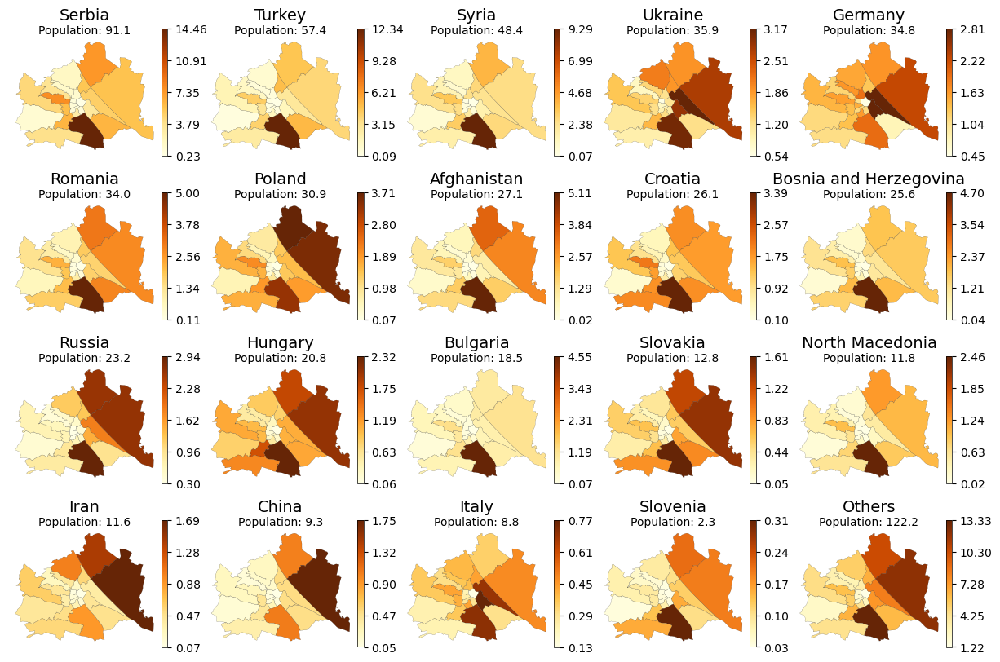

In [30]:
# Get column names within the specified range and store them in an array (list)
range_column_names = vienna_population2023_total.loc[:, "Serbia":"Slovenia"].columns.tolist()+["Others"]
population=migrants_austrians.groupby(['Country_Name']).Total_Per_District.sum()
# Define the number of rows and columns in the grid
n_rows, n_cols = 4, 5
# Create a figure and a set of subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 10))
# Loop to plot each column in a subplot
i=0
for density in range_column_names:
    row, col = divmod(i, n_cols)
    ax = axes[row, col]
    vienna_population2023_total.plot(column=density, ax=ax, legend=False, cmap='YlOrBr', edgecolor='black', linewidth=0.1, legend_kwds={'format': '%.3f'})

    # Customize the colorbar for each subplot
    cax = fig.add_axes([ax.get_position().x0 + 0.125, ax.get_position().y0, 0.005, ax.get_position().height])  # Adjust the position and size of the colorbar
    cb = plt.colorbar(ax.collections[0], cax=cax, orientation='vertical')

    # Set the number of ticks on the colorbar
    num_ticks = 5
    tick_values = np.linspace(vienna_population2023_total[density].min(), vienna_population2023_total[density].max(), num_ticks)
    tick_labels = [f'{tick/ 1e3:.2f}' for tick in tick_values]

    cb.set_ticks(tick_values)
    cb.set_ticklabels(tick_labels)
    cb.ax.tick_params(labelsize=10)
    cb.outline.set_linewidth(0.5)  # Adjust the linewidth as needed

    # Add subtitle below each subfigure
    subtitle_text = f"Population: {population[density] / 1e3:.1f}"  # Modify this based on your variable
    #ax.set_title(density)
    ax.text(0.5, 1.18, density, ha='center', va='center', transform=ax.transAxes, fontsize=14)
    ax.text(0.5, 1.05, subtitle_text, ha='center', va='center', transform=ax.transAxes, fontsize=10)
    ax.set_axis_off()
    #ax.set_aspect('equal')  # Set the aspect ratio to 'equal'
    # You can customize the appearance of each subplot if needed
    # Set the position to adjust the height of each subplot
    pos = ax.get_position()
    ax.set_position([pos.x0, pos.y0, pos.width - 0.009, pos.height - 0.009])
    
    i+=1

# Remove empty subplots if the number of columns to plot is less than the grid size
for i in range(len(range_column_names), n_rows * n_cols):
    row, col = divmod(i, n_cols)
    fig.delaxes(axes[row, col])
# Add space between subplots
#plt.tight_layout()

fig.savefig("Figures/SI/S3.pdf", bbox_inches='tight', pad_inches=0.1)
# Display the plot
plt.show()

### Figure S4
Population fraction of each country relative to the whole population in each district.

In [31]:
vienna_population2023 = vienna.merge(population2023, left_on="DISTRICT_CODE", right_on="Postal_Code")
migrants_grouped = migrants.groupby(["Postal_Code"]).Total_Per_District.sum()
vienna_population2023 = vienna_population2023.merge(migrants_grouped, left_on="DISTRICT_CODE", right_on="Postal_Code")
Country_names = migrants['Country_Name'].unique().tolist()
for i in Country_names:
    aux=migrants[migrants['Country_Name']==i]
    aux=vienna_population2023.merge(aux, left_on="DISTRICT_CODE", right_on="Postal_Code")
    vienna_population2023[i]=aux["Total_Per_District_y"]/aux["POP_TOTAL"]
vienna_population2023["Austria"]=(vienna_population2023["POP_TOTAL"]-vienna_population2023["Total_Per_District"])/vienna_population2023["POP_TOTAL"]
vienna_population2023.to_file("Datasets/vienna_population2023_others.json",index=False)

In [32]:
Total_migrants=vienna_population2023["Total_Per_District"].sum()
Total_population = vienna_population2023["POP_TOTAL"].sum()

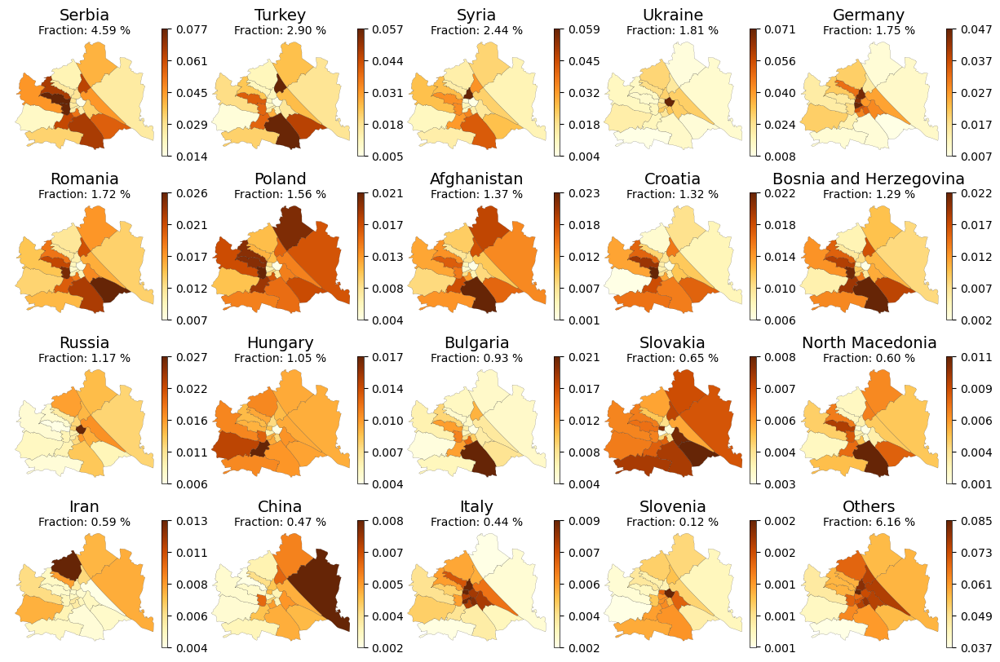

In [33]:
cumulative = (migrants_austrians.groupby(['Country_Name']).Total_Per_District.sum()/Total_population)*100
# Define the number of rows and columns in the grid
n_rows, n_cols = 4, 5
# Create a figure and a set of subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 10))
# Loop to plot each column in a subplot
i=0
for density in range_column_names:
    row, col = divmod(i, n_cols)
    ax = axes[row, col]
    vienna_population2023.plot(column=density, ax=ax, legend=False, cmap='YlOrBr', edgecolor='black', linewidth=0.1, legend_kwds={'format': '%.3f'})

    # Customize the colorbar for each subplot
    cax = fig.add_axes([ax.get_position().x0 + 0.125, ax.get_position().y0, 0.005, ax.get_position().height])  # Adjust the position and size of the colorbar
    cb = plt.colorbar(ax.collections[0], cax=cax, orientation='vertical')

    # Set the number of ticks on the colorbar
    num_ticks = 5
    tick_values = np.linspace(vienna_population2023[density].min(), vienna_population2023[density].max(), num_ticks)
    tick_labels = [f'{tick:.3f}' for tick in tick_values]

    cb.set_ticks(tick_values)
    cb.set_ticklabels(tick_labels)
    cb.ax.tick_params(labelsize=10)
    cb.outline.set_linewidth(0.5)  # Adjust the linewidth as needed

    # Add subtitle below each subfigure
    subtitle_text = f"Fraction: {cumulative[density]:.2f} %"  # Modify this based on your variable
    #ax.set_title(density)
    ax.text(0.5, 1.18, density, ha='center', va='center', transform=ax.transAxes, fontsize=14)
    ax.text(0.5, 1.05, subtitle_text, ha='center', va='center', transform=ax.transAxes, fontsize=10)
    ax.set_axis_off()
    # You can customize the appearance of each subplot if needed
    # Set the position to adjust the height of each subplot
    pos = ax.get_position()
    ax.set_position([pos.x0, pos.y0, pos.width - 0.009, pos.height - 0.009])
    
    i+=1

# Remove empty subplots if the number of columns to plot is less than the grid size
for i in range(len(range_column_names), n_rows * n_cols):
    row, col = divmod(i, n_cols)
    fig.delaxes(axes[row, col])
# Add space between subplots
#plt.tight_layout()

fig.savefig("Figures/SI/S4.pdf", bbox_inches='tight', pad_inches=0.1)
# Display the plot
plt.show()

### Figure 5
Bipartite Network representation.

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\2187905892.py:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis_colormap = cm.get_cmap('viridis')


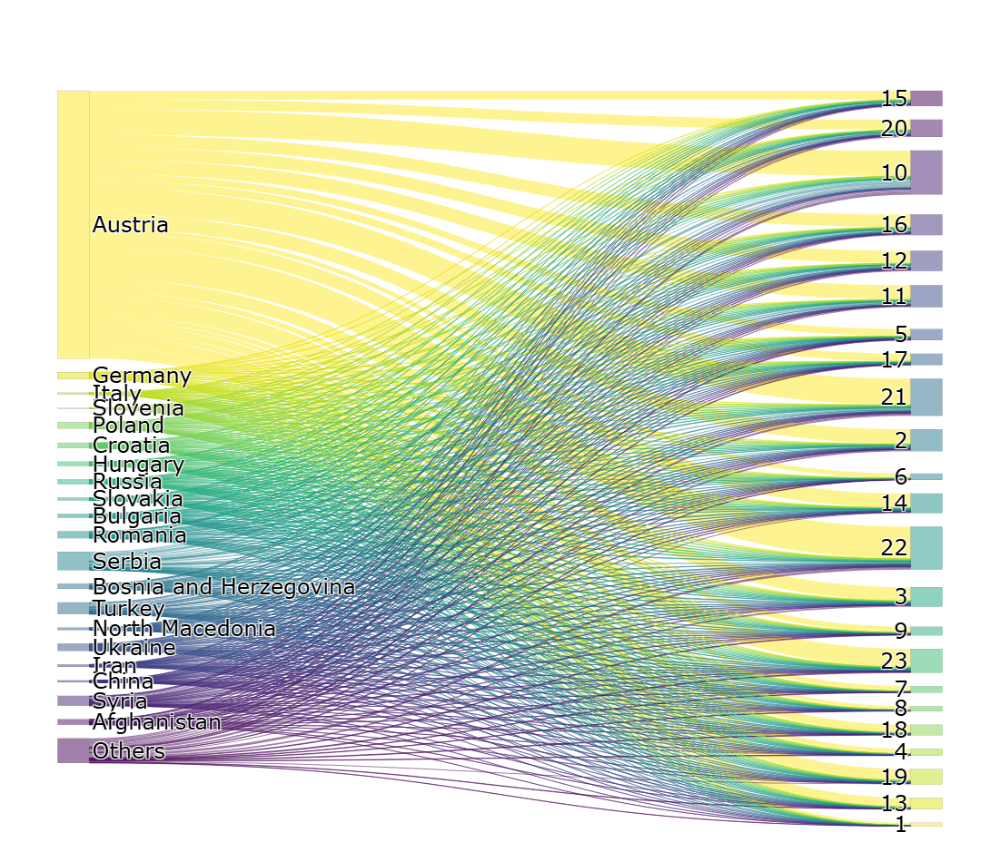

In [34]:
# Group by 'Country_Name' and 'Postal_Code' and sum the 'Total_Per_District'
grouped_df = migrants_austrians.groupby(['Country_Name', 'Postal_Code'])['Total_Per_District'].sum().reset_index()

# Convert Postal_Code to strings for consistent mapping
migrants_austrians['Postal_Code'] = migrants_austrians['Postal_Code'].astype(str)
grouped_df['Postal_Code'] = grouped_df['Postal_Code'].astype(str)

# Define the desired order for 'Country_Name' and 'Postal_Code'
ordered_countries = [
    "Austria", "Germany", "Italy", "Slovenia", "Poland", "Croatia", "Hungary", "Russia", 
    "Slovakia", "Bulgaria", "Romania", "Serbia", "Bosnia and Herzegovina", "Turkey", 
    "North Macedonia", "Ukraine", "Iran", "China", "Syria", "Afghanistan","Others"
]

ordered_postal_codes = [
    "1150", "1200", "1100", "1160", "1120", "1110", "1050", "1170", "1210", 
    "1020", "1060", "1140", "1220", "1030", "1090", "1230", "1070", "1080", 
    "1180", "1040", "1190", "1130", "1010"
]

# Combine ordered nodes
ordered_nodes = ordered_countries + ordered_postal_codes

grouped_df['source'] = grouped_df['Country_Name'].apply(lambda x: ordered_nodes.index(x))
grouped_df['target'] = grouped_df['Postal_Code'].apply(lambda x: ordered_nodes.index(x))

# Convert Postal_Code to strings and modify to remove the first and last digits
grouped_df['Postal_Code_Short'] = grouped_df['Postal_Code'].astype(str).str[1:3]
grouped_df['Postal_Code_Short'] = grouped_df['Postal_Code_Short'].apply(lambda x: x[:2] if x[0] != '0' else x[1])

# Update `ordered_postal_codes` to use modified labels
ordered_postal_codes_short = [
    postal_code[1:3] if postal_code[1] != '0' else postal_code[2] for postal_code in ordered_postal_codes
]

# Define the number of source and target nodes
num_source_nodes = len(ordered_countries)  # Source nodes (countries)
num_target_nodes = len(ordered_postal_codes_short)  # Target nodes (postal codes)

#Sort by Source and then Destination
migrants_austrians['Country_Name'] = pd.Categorical(migrants_austrians['Country_Name'], ["Austria", "Germany", "Italy", "Slovenia", "Poland", 
                                                                                         "Croatia", "Hungary", "Russia", "Slovakia", "Bulgaria", 
                                                                                         "Romania", "Serbia", "Bosnia and Herzegovina", "Turkey", 
                                                                                         "North Macedonia", "Ukraine", "Iran", "China", "Syria", 
                                                                                         "Afghanistan","Others"])
migrants_austrians['Postal_Code'] = pd.Categorical(migrants_austrians['Postal_Code'], ["1150", "1200", "1100", "1160", "1120", "1110", "1050", 
                                                                                       "1170", "1210", "1020", "1060", "1140", "1220", "1030", 
                                                                                       "1090", "1230", "1070", "1080", "1180", "1040", "1190", 
                                                                                       "1130", "1010"])
migrants_austrians.sort_values(['Country_Name', 'Postal_Code'], inplace = True)
migrants_austrians.reset_index(drop=True)

# Define the number of source and target nodes
num_source_nodes = len(ordered_countries)  # Source nodes (countries)
num_target_nodes = len(ordered_postal_codes)  # Target nodes (postal codes)

# Get the viridis colormap
viridis_colormap = cm.get_cmap('viridis')

# Define the alpha transparency level (you can adjust this value)
alpha = 0.5

# Generate reversed colors for source nodes using viridis
source_node_colors = [viridis_colormap((num_source_nodes - 1 - i) / (num_source_nodes - 1)) for i in range(num_source_nodes)]
source_node_colors_rgba = [
    f'rgba({int(color[0] * 255)}, {int(color[1] * 255)}, {int(color[2] * 255)}, {alpha})' 
    for color in source_node_colors
]

# Generate colors for target nodes using viridis
target_node_colors = [viridis_colormap(i / (num_target_nodes - 1)) for i in range(num_target_nodes)]
target_node_colors_rgba = [
    f'rgba({int(color[0] * 255)}, {int(color[1] * 255)}, {int(color[2] * 255)}, {alpha})' 
    for color in target_node_colors
]

# Create node color mapping for both sources and targets
node_colors = {ordered_countries[i]: source_node_colors_rgba[i] for i in range(num_source_nodes)}
for i, postal_code_short in enumerate(ordered_postal_codes_short):
    node_colors[postal_code_short] = target_node_colors_rgba[i]

# Create the node color list for Plotly (matching the order in ordered_nodes)
ordered_nodes_short = ordered_countries + ordered_postal_codes_short
node_color_list = [node_colors[node] for node in ordered_nodes_short]

# Create the link colors for the Sankey diagram
link_colors = [node_colors[ordered_countries[source]] for source in grouped_df['source']]

mynode = dict(
      pad = 15,
      thickness = 35,
      line = dict(color = "black", width = 0.1),
      label=ordered_nodes_short,
      x = [0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001,0.001, 0.001, 0.001, 0.001, 
           0.001, 0.001, 0.001, 0.001,0.001, 0.999, 0.999, 0.999, 0.999, 0.999, 0.999, 0.999, 0.999, 0.999, 0.999, 0.999, 0.999,
           0.999, 0.999, 0.999, 0.999, 0.999, 0.999, 0.999, 0.999, 0.999, 0.999, 0.999],

    
      y = [0.001, 729431/1982097, 800431/1982097, 829431/1982097, 929431/1982097, 1006238/1982097, 1010323/1982097, 
           1050323/1982097, 1100323/1982097, 1150323/1982097, 1200323/1982097, 1250323/1982097, 1300323/1982097, 
           1350323/1982097, 1400323/1982097, 1450323/1982097, 1500323/1982097, 1550323/1982097, 1600323/1982097, 
           1650323/1982097, 1802097/1982097,   
           0.001, 76109/1982097, 161799/1982097, 380214/1982097, 482658/1982097, 582939/1982097, 691977/1982097, 
           746995/1982097, 803028/1982097, 986923/1982097, 1095192/1982097, 1126615/1982097, 1223443/1982097, 
           1436101/1982097, 1532857/1982097, 1575063/1982097, 1692945/1982097, 1724526/1982097, 1749200/1982097, 
           1800759/1982097, 1834392/1982097, 1909909/1982097, 1965477/1982097], 
    color = node_color_list)

mylink = dict(
    source=grouped_df['source'],  # Ensure indices are in the correct order
    target=grouped_df['target'],  # Ensure indices are in the correct order
    value=grouped_df['Total_Per_District'],  # Use the summed values
    color=link_colors)  # Set link color

fig = go.Figure(data=[go.Sankey(
    arrangement='snap',
    node = mynode,
    link = mylink
)])

# Customize the diagram
fig.update_layout(
    height=950,  # Increase the height for vertical space
    width=1000,  # Adjust width as needed
    font=dict(size=24),  # Set font size globally (affects labels and title)
    font_color="black"   # Set the font color
)
fig.write_image("Figures/SI/S5.pdf", format="pdf", width=1000, height=950)
fig.show()

### Figure S6
Significant co-living links and strength of co-residence.

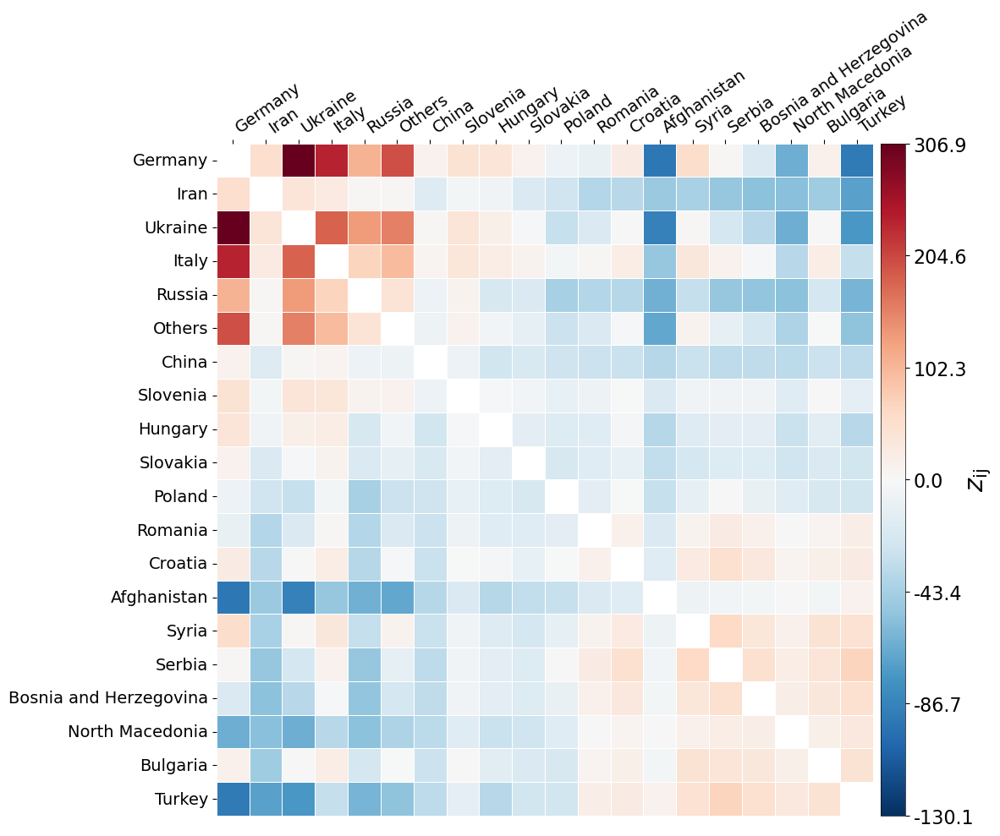

In [35]:
# Assuming df_zscores_aus is your DataFrame and 'Source', 'Target', 'Weight' are the column names.
df_zscores_aus = pd.read_csv("Datasets/zscores.csv")
# Get column names within the specified range and store them in an array (list)
range_column_names_infomap = ["Germany","Iran","Ukraine","Italy",
                                        "Russia","Others","China","Slovenia","Hungary","Slovakia",
                                        "Poland","Romania","Croatia","Afghanistan",
                                       "Syria","Serbia","Bosnia and Herzegovina","North Macedonia","Bulgaria","Turkey"]
# Create the pivot table
pivot = df_zscores_aus.pivot(index='Source', columns='Target', values='Weight')

# Reorder the rows and columns based on the specified order
pivot = pivot.reindex(index=range_column_names_infomap, columns=range_column_names_infomap)

min_height=df_zscores_aus["Weight"].min()
max_height=df_zscores_aus["Weight"].max()
midpoint = 0  # Value at which white color will be centered
norm = colors.TwoSlopeNorm(vmin=min_height, vcenter=midpoint, vmax=max_height)
cmap = plt.colormaps.get_cmap('RdBu_r')

# Create a ScalarMappable to map normalized values to colors
mapper = ScalarMappable(norm=norm, cmap=cmap)
# Map colors to the normalized heights
bar_colors = [mapper.to_rgba(height) for height in df_zscores_aus["Weight"]]

# Create a larger figure for better readability
fig, ax = plt.subplots(figsize=(12, 10))

# Use the colormap and norm explicitly in the heatmap
sns.heatmap(pivot, annot=False, fmt='.2f', cmap=cmap, linewidths=0.5, norm=norm, 
            xticklabels=True, yticklabels=True, ax=ax, cbar=False)

# Rotate horizontal labels
ax.xaxis.tick_top()
ax.set_xticklabels(ax.get_xticklabels(), rotation=35, ha='left', fontsize=14)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=14)

ax.tick_params(axis='both', which='both', left=True, bottom=False, top=True, right=False)#, labelbottom=False, labelright=False)

# Remove "Source" and "Target" labels
ax.set_xlabel("")
ax.set_ylabel("")

colorbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap),
             ax=ax, orientation='vertical', shrink=1, aspect=28, pad=0.01)

colorbar.set_label(r'$z_{\mathrm{ij}}$', rotation=90, fontdict={'size': 22, 'style': 'italic'}, labelpad=-6)

# Set the number of ticks on the colorbar
midpoint=0
num_ticks = 3  # This gives you 2 positive ticks + 0 + 2 negative ticks
positive_ticks = np.linspace(midpoint, df_zscores_aus["Weight"].max(), num=num_ticks+1)[1:]  # Exclude 0 for positive ticks
negative_ticks = np.linspace(df_zscores_aus["Weight"].min(), midpoint, num=num_ticks+1)[:-1]  # Exclude 0 for negative ticks

# Concatenate negative ticks, zero, and positive ticks
tick_values = np.concatenate([negative_ticks, [midpoint], positive_ticks])    
tick_labels = [f'{tick:.1f}' for tick in tick_values]

colorbar.set_ticks(tick_values)
colorbar.set_ticklabels(tick_labels)
colorbar.ax.tick_params(labelsize=16)
colorbar.outline.set_linewidth(0.5)  # Adjust the linewidth as needed

# Show the heatmap
plt.tight_layout()  # Adjust layout for better appearance
plt.show()
fig.savefig("Figures/SI/S6a.pdf", bbox_inches='tight', pad_inches=0.1)

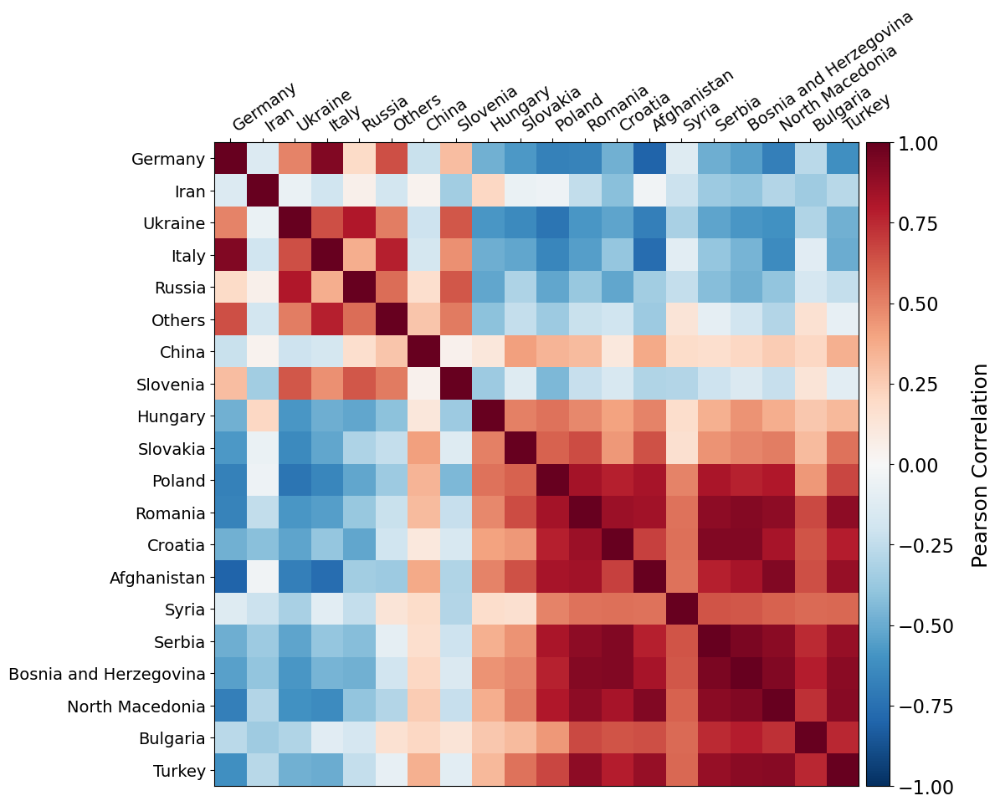

In [36]:
infomap_fraction=vienna_population2023[range_column_names_infomap]
cmap = sns.diverging_palette(250, 10, as_cmap=True)
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111)
cax = ax.matshow(infomap_fraction.corr(method="pearson"),cmap="RdBu_r", vmin=-1, vmax=1)

# Set ticks for all labels
ax.set_xticks(np.arange(len(range_column_names_infomap)))
ax.set_yticks(np.arange(len(range_column_names_infomap)))
ax.set_xticklabels(range_column_names_infomap,rotation=35,ha='left', fontsize=14)
ax.set_yticklabels(range_column_names_infomap, fontsize=14)
# Only show ticks on the top and left axes
ax.tick_params(axis='both', which='both', left=True, bottom=False, right=False, labelbottom=False, labelright=False)

# Create colorbar and adjust its size and position
cbar = fig.colorbar(cax, pad=0.01, aspect=28)
cbar.ax.tick_params(labelsize=16)  # Increase font size of colorbar labels
cbar.set_label('Pearson Correlation', fontsize=18, labelpad=15)  # Set label for the colorbar
#cbar.outline.set_linewidth(0.8)

fig.savefig("Figures/SI/S6b.pdf", bbox_inches='tight', pad_inches=0.1)

In [37]:
# Calculate the Pearson correlation matrix
correlation_matrix = infomap_fraction.corr(method="pearson")
# Save the correlation matrix to a CSV file
correlation_matrix.to_csv("Datasets/PearsonCorrelations.csv")

### Figure S7
District-level population fraction deviations from city-wide expectations in Vienna

In [38]:
vienna_expected = vienna_population2023.copy()
total_country = migrants.groupby(["Country_Name"]).Total_Per_District.sum()/Total_population
total_country['Austria']=(Total_population-Total_migrants)/Total_population
for i in Country_names:
    vienna_expected[i]=np.log(vienna_expected[i]/total_country[i])
vienna_expected["Austria"]=np.log(vienna_expected["Austria"]/total_country["Austria"])
vienna_expected.to_file("Datasets/vienna_population2023_others_expected.json",index=False)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\2204903142.py:6: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\2204903142.py:9: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



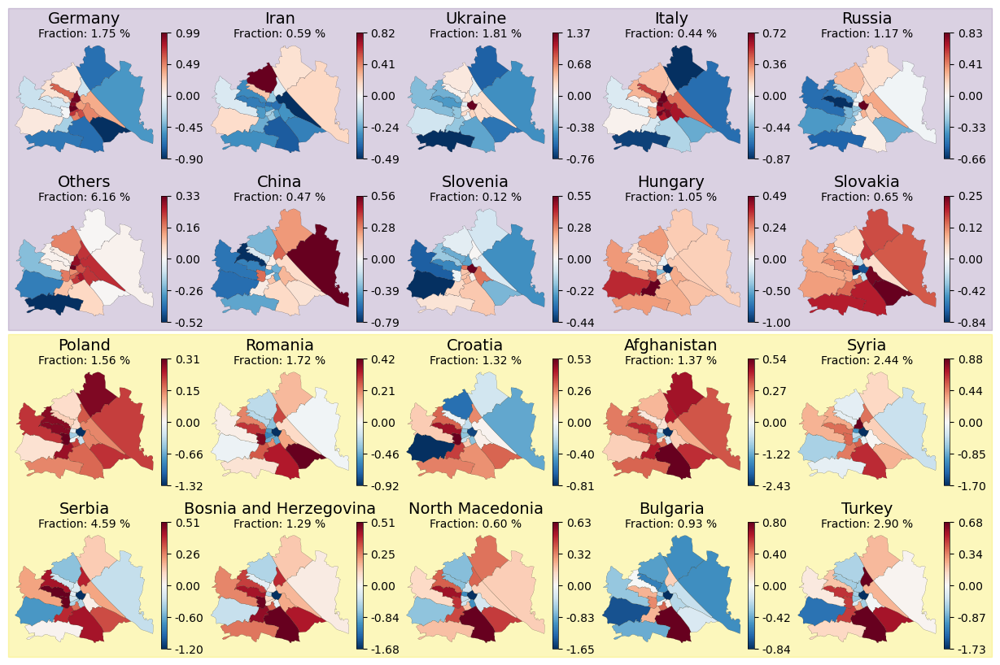

In [39]:
# Define the number of rows and columns in the grid
n_rows, n_cols = 4, 5
# Create a figure and a set of subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 10))
# Choose a colormap
cmap = plt.cm.get_cmap('RdBu_r')

# Define the viridis colormap
viridis_colormap = cm.get_cmap('viridis')
# Choose specific values in the viridis colormap for purples and yellows
purple_color = viridis_colormap(0.08)
yellow_color = viridis_colormap(0.99)

# Store subplot positions
subplot_positions = []

# Loop to plot each column in a subplot
i = 0
for density in range_column_names_infomap:
    row, col = divmod(i, n_cols)
    ax = axes[row, col]

    # Normalize data
    min_height = vienna_expected[density].min()
    max_height = vienna_expected[density].max()
    midpoint = 0  # Value at which white color will be centered
    norm = colors.TwoSlopeNorm(vmin=min_height, vcenter=midpoint, vmax=max_height)
    
    # Create a ScalarMappable to map normalized values to colors
    mapper = ScalarMappable(norm=norm, cmap=cmap)
    
    # Map colors to the normalized heights
    bar_colors = [mapper.to_rgba(height) for height in vienna_expected[density]]
    
    vienna_expected.plot(column=density, ax=ax, legend=False, cmap=cmap, edgecolor='black', linewidth=0.1, facecolor=bar_colors)
    ax.set_axis_off()
    
    # Customize the colorbar for each subplot
    cax = fig.add_axes([ax.get_position().x0 + 0.125, ax.get_position().y0, 0.005, ax.get_position().height])
    cb = plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), cax=cax, orientation='vertical')

    # Set the number of ticks on the colorbar
    num_ticks = 2
    positive_ticks = np.linspace(midpoint, max_height, num=num_ticks + 1)[1:]
    negative_ticks = np.linspace(min_height, midpoint, num=num_ticks + 1)[:-1]
    tick_values = np.concatenate([negative_ticks, [midpoint], positive_ticks])    
    tick_labels = [f'{tick:.2f}' for tick in tick_values]
    
    cb.set_ticks(tick_values)
    cb.set_ticklabels(tick_labels)
    cb.ax.tick_params(labelsize=10)
    cb.outline.set_linewidth(0.5)

    # Add subtitle below each subfigure
    subtitle_text = f"Fraction: {cumulative[density]:.2f} %"
    ax.text(0.5, 1.18, density, ha='center', va='center', transform=ax.transAxes, fontsize=14)
    ax.text(0.5, 1.05, subtitle_text, ha='center', va='center', transform=ax.transAxes, fontsize=10)
    ax.set_axis_off()

    # Adjust the height of each subplot
    pos = ax.get_position()
    ax.set_position([pos.x0, pos.y0, pos.width - 0.009, pos.height - 0.009])

    # Store positions for later use
    subplot_positions.append(pos)

    i += 1

# Remove empty subplots if the number of columns to plot is less than the grid size
for i in range(len(range_column_names_infomap), n_rows * n_cols):
    row, col = divmod(i, n_cols)
    fig.delaxes(axes[row, col])

# Add rectangles for the first and last 8 subplots
if len(subplot_positions) >= 8:
    first_8_positions = subplot_positions[:8]
    last_8_positions = subplot_positions[-8:]

    # Calculate bounds for the first 8 subplots
    x_min_first = min(pos.x0 for pos in first_8_positions)
    x_max_first = max(pos.x0 + pos.width for pos in first_8_positions)
    y_min_first = min(pos.y0 for pos in first_8_positions)
    y_max_first = max(pos.y0 + pos.height for pos in first_8_positions)

    # Calculate bounds for the last 8 subplots
    x_min_last = min(pos.x0 for pos in last_8_positions)
    x_max_last = max(pos.x0 + pos.width for pos in last_8_positions)
    y_min_last = min(pos.y0 for pos in last_8_positions)
    y_max_last = max(pos.y0 + pos.height for pos in last_8_positions)

    # Add rectangles directly to the figure
    fig.patches.extend([
        Rectangle((x_min_first, y_min_first-0.01), x_max_first - x_min_first+0.031, y_max_first - y_min_first+0.04,
                  transform=fig.transFigure, color=purple_color, alpha=0.2, zorder=-1),
        Rectangle((x_min_last, y_min_last-0.01), x_max_last - x_min_last+0.031, y_max_last - y_min_last+0.04,
                  transform=fig.transFigure, color=yellow_color, alpha=0.3, zorder=-1)
    ])

# Save and display the plot
plt.savefig("Figures/SI/S7.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

### Figure S8
Clustering countries sharing similar residence interests using Bonferroni correction.

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\946608761.py:27: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\Usuario\anaconda3\envs\data\lib\site-packages\geopandas\tools\clip.py:63: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`



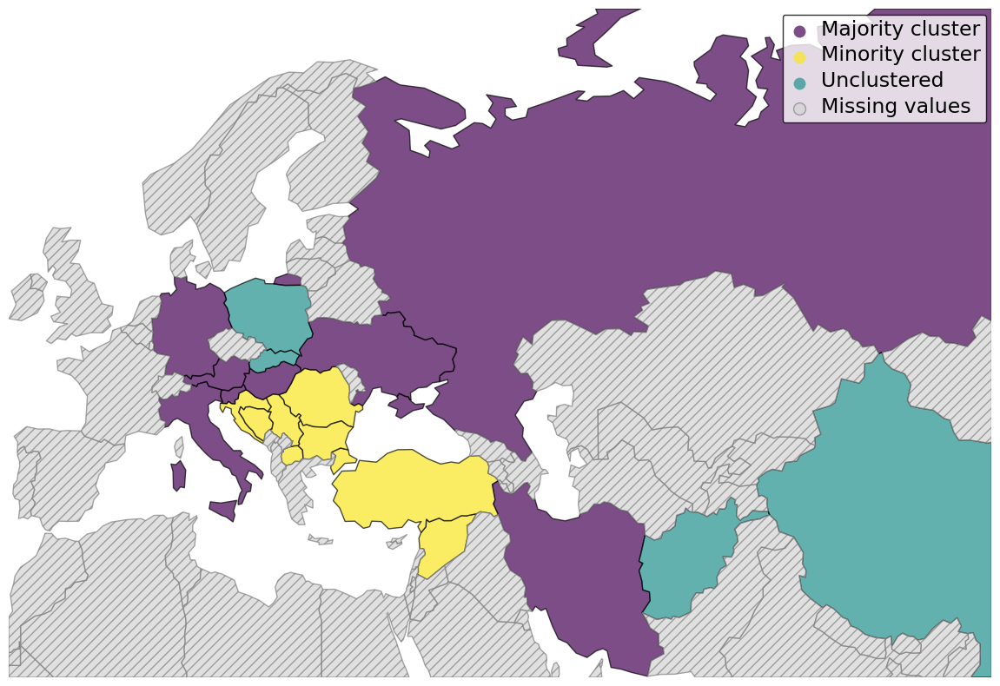

In [40]:
# Define a mapping of countries to categories
country_to_module_Bonferrini = {
    'Ukraine': 'Majority cluster',
    'Russia': 'Majority cluster',
    'Germany': 'Majority cluster',
    'North Macedonia': 'Minority cluster',
    'Romania': 'Minority cluster',
    'Hungary': 'Majority cluster',
    'Slovakia': 'Unclustered',
    'Poland': 'Unclustered',
    'Austria': 'Majority cluster',
    'Italy': 'Majority cluster',
    'Republic of Serbia': 'Minority cluster',
    'Croatia': 'Minority cluster',
    'Slovenia': 'Majority cluster',
    'Bulgaria': 'Minority cluster',
    'Bosnia and Herzegovina': 'Minority cluster',
    'China': 'Unclustered',
    'Syria': 'Minority cluster',
    'Turkey': 'Minority cluster',
    'Iran': 'Majority cluster',
    'Afghanistan': 'Unclustered',
}
# Add a new 'Category' column based on the mapping
world['Module_B'] = world['sovereignt'].map(country_to_module_Bonferrini)

viridis = cm.get_cmap('viridis', 256)  # Load the viridis colormap
custom_colors = [viridis(0), viridis(0.99), viridis(0.5)]  # Majority -> Purple, Minority -> Yellow, Unclustered -> Green
cmap = ListedColormap(custom_colors)

ax=world.clip([-10, 25, 100, 75]).plot(column="Module_B", cmap=cmap, edgecolor='black', legend=True, figsize=(15, 10), alpha=0.7, aspect=1.2, missing_kwds={
        "color": "lightgrey",
        "edgecolor": "grey",
        "hatch": "///",
        "label": "Missing values",
    })
ax.set_axis_off();
ax.margins(0)
# Get the legend
legend = ax.get_legend()

# Adjust legend size
for text in legend.get_texts():
    text.set_fontsize(17)

# Set legend frame properties
legend.set_frame_on(True)
legend.get_frame().set_facecolor('white')
legend.get_frame().set_edgecolor('black')
plt.savefig("Figures/SI/S8a.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

### Figure S9
Neighbourhood wealth distributions.

First, we compute the Population fraction of each country in each district

In [41]:
vienna_population2023_country = vienna.merge(population2023, left_on="DISTRICT_CODE", right_on="Postal_Code")
migrants_grouped = migrants.groupby(["Postal_Code"]).Total_Per_District.sum()
vienna_population2023_country = vienna_population2023_country.merge(migrants_grouped, left_on="DISTRICT_CODE", right_on="Postal_Code")
Country_names = migrants['Country_Name'].unique().tolist()
for i in Country_names:
    aux=migrants[migrants['Country_Name']==i]
    total=aux.Total_Per_District.sum()
    aux=vienna_population2023_country.merge(aux, left_on="DISTRICT_CODE", right_on="Postal_Code")
    vienna_population2023_country[i]=aux["Total_Per_District_y"]/total
vienna_population2023_country["Austria"]=(vienna_population2023_country["POP_TOTAL"]-vienna_population2023_country["Total_Per_District"])/(vienna_population2023_country["POP_TOTAL"].sum()-vienna_population2023_country["Total_Per_District"].sum())
vienna_population2023_country.to_file("Datasets/vienna_population2023_others_country.json",index=False)

In [42]:
fraction_income = vienna_population2023_country.merge(income2020, left_on="DISTRICT_CODE", right_on="Postal_Code")
fraction_income = fraction_income.merge(rentalprice, left_on="DISTRICT_CODE", right_on="Postal_Code")

In [43]:
#Preprocessing the median origin income data
medianincomecountries_filter=medianincomecountries[medianincomecountries["country"].isin(["China", "Russia","Iran","Turkey","Germany","Italy","Poland","Ukraine","Syria"
                                                             ,"Romania","Hungary","Austria","Serbia","Bulgaria","Slovakia","Croatia","Bosnia and Herzegovina"
                                                             ,"Afghanistan","Slovenia","North Macedonia"])][["country","medianIncomeByCountry_medianIncome","medianIncomeByCountry_DataYear"]].reset_index(drop=True)
medianincomecountries_filter.loc[len(medianincomecountries_filter.index)] = ['Afghanistan', np.NaN,np.NaN] 
# From USD to € for 2020
medianincomecountries_filter["medianIncome_euro"]=medianincomecountries_filter["medianIncomeByCountry_medianIncome"]*0.877/1000

Linear regression to contruct boxplots

In [44]:
def lineal_regression(quartile,x1,x2,y1,y2):
    m=(y2-y1)/(x2-x1)
    n=y1-m*x1
    return float((quartile-n)/m)

Income Analysis

In [45]:
# Get column names within the specified range and store them in an array (list)
range_column_names_box = fraction_income.loc[:, "Others":"Austria"].columns.tolist()
box_df_reg = pd.DataFrame(columns=['label','med','q1','q3','whislo','whishi','fliers'])
fraction_income=fraction_income.sort_values("AVERAGE_NETINCOME_TOTAL", ascending=True).reset_index(drop=True)
i=0
for column_name, column_values in fraction_income[range_column_names_box].items():
     # Iterate over rows
    density_old=0
    for index, value in column_values.items():
        density_new=density_old+value
        if density_new>0.05 and density_old<0.05:
            if index==0:
                whislo=lineal_regression(0.05,0,fraction_income.at[index, 'AVERAGE_NETINCOME_TOTAL'],density_old,density_new)
                #print(column_name,density_old,density_new,0,dir.at[index, 'AVERAGE_NETINCOME_TOTAL'],whislo)
            else:
                whislo=lineal_regression(0.05,fraction_income.at[index-1, 'AVERAGE_NETINCOME_TOTAL'],fraction_income.at[index, 'AVERAGE_NETINCOME_TOTAL'],density_old,density_new)
                #print(column_name,density_old,density_new,dir.at[index-1, 'AVERAGE_NETINCOME_TOTAL'],dir.at[index, 'AVERAGE_NETINCOME_TOTAL'],whislo)
        elif density_new>0.25 and density_old<0.25:
            q1=lineal_regression(0.25,fraction_income.at[index-1, 'AVERAGE_NETINCOME_TOTAL'],fraction_income.at[index, 'AVERAGE_NETINCOME_TOTAL'],density_old,density_new)
        elif density_new>0.50 and density_old<0.50:
            med=lineal_regression(0.50,fraction_income.at[index-1, 'AVERAGE_NETINCOME_TOTAL'],fraction_income.at[index, 'AVERAGE_NETINCOME_TOTAL'],density_old,density_new)
            #print(column_name,density_old,density_new,dir.at[index-1, 'AVERAGE_NETINCOME_TOTAL'],dir.at[index, 'AVERAGE_NETINCOME_TOTAL'],med)
        elif density_new>0.75 and density_old<0.75:
            q3=lineal_regression(0.75,fraction_income.at[index-1, 'AVERAGE_NETINCOME_TOTAL'],fraction_income.at[index, 'AVERAGE_NETINCOME_TOTAL'],density_old,density_new)
        elif density_new>0.95 and density_old<0.95:
            whishi=lineal_regression(0.95,fraction_income.at[index-1, 'AVERAGE_NETINCOME_TOTAL'],fraction_income.at[index, 'AVERAGE_NETINCOME_TOTAL'],density_old,density_new)
            #print(column_name,density_old,density_new,dir.at[index-1, 'AVERAGE_NETINCOME_TOTAL'],dir.at[index, 'AVERAGE_NETINCOME_TOTAL'],whishi)
        density_old=density_new

    
    box_df_reg.at[i, 'label'] = column_name
    box_df_reg.at[i, 'med'] = med
    box_df_reg.at[i, 'q1'] = q1
    box_df_reg.at[i, 'q3'] = q3
    box_df_reg.at[i, 'whislo'] = whislo
    box_df_reg.at[i, 'whishi'] = whishi
    box_df_reg.at[i, 'fliers'] = ''

    mask=medianincomecountries_filter['country'] == column_name
    selected_values = medianincomecountries_filter.loc[mask, 'medianIncome_euro'].values
    
    # Check if selected_values is not empty before accessing elements
    if len(selected_values) > 0:
        single_value = selected_values[0]
    else:
        single_value = np.NaN
        print(f"No value found for {column_name}")
    box_df_reg.at[i, 'mean'] = single_value
    i=i+1
box_df_reg=box_df_reg.sort_values("med", ascending=False).reset_index(drop=True)
box_dict_reg=box_df_reg.to_dict('records')

No value found for Others


C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\3399281563.py:4: UserWarning:

linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "" (-> linestyle='-'). The keyword argument will take precedence.

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\3399281563.py:23: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



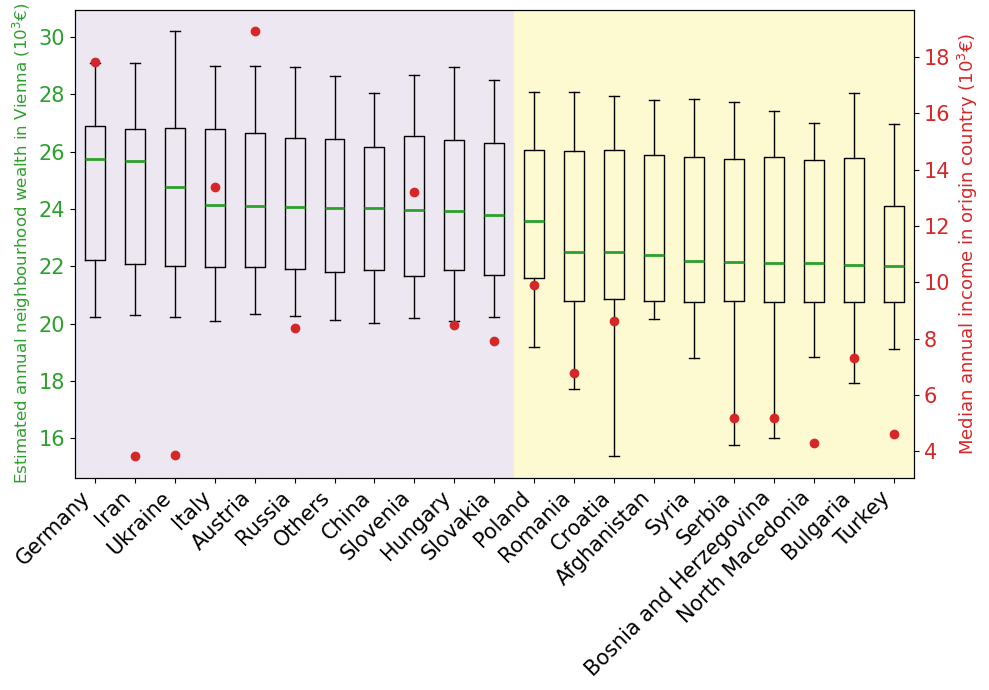

In [46]:
fig, ax1 = plt.subplots(figsize=(10, 7))
color = 'tab:green'
ax1.set_ylabel('Estimated annual neighbourhood wealth in Vienna $(10^3 €)$', color=color , fontsize=12)
bp = ax1.bxp(box_dict_reg)
ax1.set_xticks(np.arange(1, len(box_df_reg["label"]) + 1))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=15)
ax1.tick_params(axis='y', labelcolor=color, labelsize=15)  # Adjust fontsize for y-axis ticks

ax2 = ax1.twinx()

color2 = 'tab:red'
ax2.set_ylabel('Median annual income in origin country $(10^3 €)$', color=color2 , fontsize=13)
ax2.scatter(np.arange(1, len(box_df_reg["label"]) + 1), box_df_reg["mean"].tolist(), marker='o', color=color2)
ax2.tick_params(axis='y', labelcolor=color2, labelsize=15)
ax2.set_xticks(np.arange(1, len(box_df_reg["label"]) + 1))
ax2.set_xticklabels(box_df_reg["label"], rotation=50, ha='right', fontsize=13)

# Change the color of median line in boxplots to match the y-axis color
for element in ['medians']:
    plt.setp(bp[element], color=color, linewidth=2)

# Define the viridis colormap
viridis_colormap = cm.get_cmap('viridis')
# Choose specific values in the viridis colormap for purples and yellows
purple_color = viridis_colormap(0.08)
yellow_color = viridis_colormap(0.99)

# Get the y-limits of the plot
y_min, y_max = ax1.get_ylim()

# Draw dashed rectangles spanning the height of the plot
rect1 = Rectangle((0.4, y_min-0.1), 11.1, y_max-y_min+0.2, fill=True, facecolor=purple_color, lw=5, alpha=0.1)
rect2 = Rectangle((len(box_df_reg["label"]) - 9.5, y_min-0.1), 10.15, y_max-y_min+0.2, fill=True, facecolor=yellow_color, lw=5, alpha=0.2)
ax1.add_patch(rect1)
ax1.add_patch(rect2)

fig.tight_layout()
plt.savefig("Figures/SI/S9a.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

In [47]:
fraction_income=fraction_income.sort_values("AVERAGE_NETINCOME_TOTAL",ascending=True)
fraction_income["QuartileIncome"] = pd.qcut(fraction_income.AVERAGE_NETINCOME_TOTAL, 4)
sum_df = pd.DataFrame(columns=['Q1','Q2','Q3','Q4','med'])
for column_name, column_values in fraction_income[range_column_names_box].items():
     # Iterate over rows
    Q1=0
    Q2=0
    Q3=0
    Q4=0
    for index, value in column_values.items():
        if fraction_income.at[index, 'AVERAGE_NETINCOME_TOTAL'] <= 22.281000:
            Q1+=value
        elif fraction_income.at[index, 'AVERAGE_NETINCOME_TOTAL'] > 22.281000  and fraction_income.at[index, 'AVERAGE_NETINCOME_TOTAL'] <= 25.816000:
            Q2+=value
        elif fraction_income.at[index, 'AVERAGE_NETINCOME_TOTAL'] > 25.816000  and fraction_income.at[index, 'AVERAGE_NETINCOME_TOTAL'] <= 27.314000:
            Q3+=value
        elif fraction_income.at[index, 'AVERAGE_NETINCOME_TOTAL'] > 27.314000:
            Q4+=value

    sum_df.at[column_name, 'Q1'] = Q1
    sum_df.at[column_name, 'Q2'] = Q2
    sum_df.at[column_name, 'Q3'] = Q3
    sum_df.at[column_name, 'Q4'] = Q4
    sum_df.at[column_name, 'med'] = Q1+Q2
sum_df=sum_df.sort_values("med", ascending=True)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\425974564.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\425974564.py:36: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.



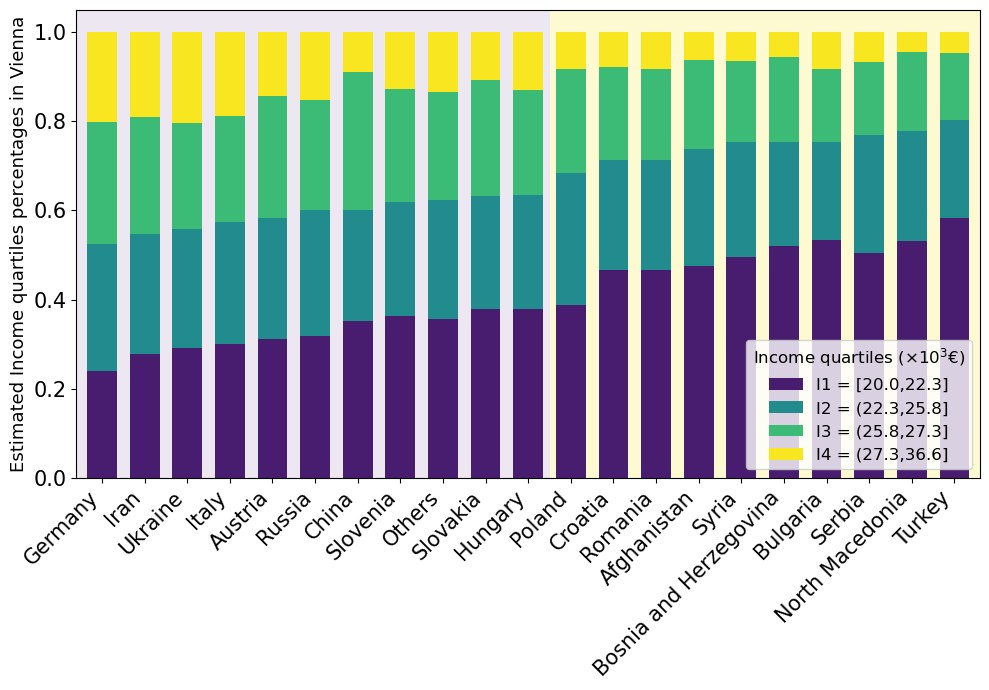

In [48]:
sum_df=sum_df.drop(columns='med')
# Define the viridis colormap
viridis_colormap = cm.get_cmap('viridis')
# Choose specific values in the viridis colormap for purples and yellows
purple_color = viridis_colormap(0.08)
blue_color = viridis_colormap(0.48)
green_color = viridis_colormap(0.68)
yellow_color = viridis_colormap(0.99)

fig, ax = plt.subplots(figsize=(10, 7))
sum_df.plot(ax=ax, kind='bar', stacked=True, color=[purple_color, blue_color, green_color, yellow_color], width=0.7, align='center')
ax.set_ylabel('Estimated Income quartiles percentages in Vienna',fontsize=13)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=15)
ax.tick_params(axis='both', labelsize=15) 

# Extract the data values
data_values = fraction_income["AVERAGE_NETINCOME_TOTAL"].values

# Calculate quantiles manually
quantiles = np.percentile(data_values, [0, 25, 50, 75, 100])  # Compute the quantile ranges (Q1-Q4)

# Customize the legend with manual quantile labels
legend = ax.get_legend()  # Get the original legend

# Custom labels for the quartiles
labels = [
    f"I1 = [{quantiles[0]:.1f},{quantiles[1]:.1f}]",
    f"I2 = ({quantiles[1]:.1f},{quantiles[2]:.1f}]",
    f"I3 = ({quantiles[2]:.1f},{quantiles[3]:.1f}]",
    f"I4 = ({quantiles[3]:.1f},{quantiles[4]:.1f}]"
]

# Replace the legend
legend.remove()
custom_legend = ax.legend(
    handles=legend.legendHandles,  # Reuse the original legend handles
    labels=labels,
    loc="lower right",  # Adjust position as needed
    title=r'Income quartiles ($\times 10^3 €$)',
    fontsize=12,  # Enlarge font size for legend text
    title_fontsize=12,  # Enlarge font size for legend title
    frameon=True,
)
# Get the y-limits of the plot
y_min, y_max = ax.get_ylim()

# Draw dashed rectangles spanning the height of the plot
rect1 = Rectangle((-0.65, y_min-0.1), 11.15, y_max-y_min+0.2, fill=True, facecolor=purple_color, lw=5, alpha=0.1, zorder=-1)
rect2 = Rectangle((len(sum_df["Q1"]) - 10.5, y_min-0.1), 10.15, y_max-y_min+0.2, fill=True, facecolor=yellow_color, lw=5, alpha=0.2, zorder=-1)
ax.add_patch(rect1)
ax.add_patch(rect2)

fig.tight_layout()
plt.savefig("Figures/SI/S9b.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

Rental Prices Analysis

In [49]:
box_df_reg_tot= pd.DataFrame(columns=['label','med','q1','q3','whislo','whishi','fliers'])
fraction_income=fraction_income.sort_values("AVERAGE/M²", ascending=True).reset_index(drop=True)
i=0
for column_name, column_values in fraction_income[range_column_names_box].items():
     # Iterate over rows
    density_old=0
    for index, value in column_values.items():
        density_new=density_old+value
        if density_new>0.05 and density_old<0.05:
            if index==0:
                whislo=lineal_regression(0.05,0,fraction_income.at[index, 'AVERAGE/M²'],density_old,density_new)
                #whislo=fraction_income.at[index, 'AVERAGE/M²']
                #print(column_name,density_old,density_new,0,dir.at[index, 'AVERAGE_NETINCOME_TOTAL'],whislo)
            else:
                whislo=lineal_regression(0.05,fraction_income.at[index-1, 'AVERAGE/M²'],fraction_income.at[index, 'AVERAGE/M²'],density_old,density_new)
                #print(column_name,density_old,density_new,dir.at[index-1, 'AVERAGE_NETINCOME_TOTAL'],dir.at[index, 'AVERAGE_NETINCOME_TOTAL'],whislo)
        elif density_new>0.25 and density_old<0.25:
            q1=lineal_regression(0.25,fraction_income.at[index-1, 'AVERAGE/M²'],fraction_income.at[index, 'AVERAGE/M²'],density_old,density_new)
        elif density_new>0.50 and density_old<0.50:
            med=lineal_regression(0.50,fraction_income.at[index-1, 'AVERAGE/M²'],fraction_income.at[index, 'AVERAGE/M²'],density_old,density_new)
            #print(column_name,density_old,density_new,dir.at[index-1, 'AVERAGE_NETINCOME_TOTAL'],dir.at[index, 'AVERAGE_NETINCOME_TOTAL'],med)
        elif density_new>0.75 and density_old<0.75:
            q3=lineal_regression(0.75,fraction_income.at[index-1, 'AVERAGE/M²'],fraction_income.at[index, 'AVERAGE/M²'],density_old,density_new)
        elif density_new>0.95 and density_old<0.95:
            whishi=lineal_regression(0.95,fraction_income.at[index-1, 'AVERAGE/M²'],fraction_income.at[index, 'AVERAGE/M²'],density_old,density_new)
            #print(column_name,density_old,density_new,dir.at[index-1, 'AVERAGE_NETINCOME_TOTAL'],dir.at[index, 'AVERAGE_NETINCOME_TOTAL'],whishi)
        density_old=density_new

    box_df_reg_tot.at[i, 'label'] = column_name
    box_df_reg_tot.at[i, 'med'] = med
    box_df_reg_tot.at[i, 'q1'] = q1
    box_df_reg_tot.at[i, 'q3'] = q3
    box_df_reg_tot.at[i, 'whislo'] = whislo
    box_df_reg_tot.at[i, 'whishi'] = whishi
    box_df_reg_tot.at[i, 'fliers'] = ''
    i=i+1
box_df_reg_tot=box_df_reg_tot.sort_values("med", ascending=False)
box_dict_reg_tot=box_df_reg_tot.to_dict('records')

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\1397582125.py:4: UserWarning:

linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "" (-> linestyle='-'). The keyword argument will take precedence.

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\1397582125.py:14: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



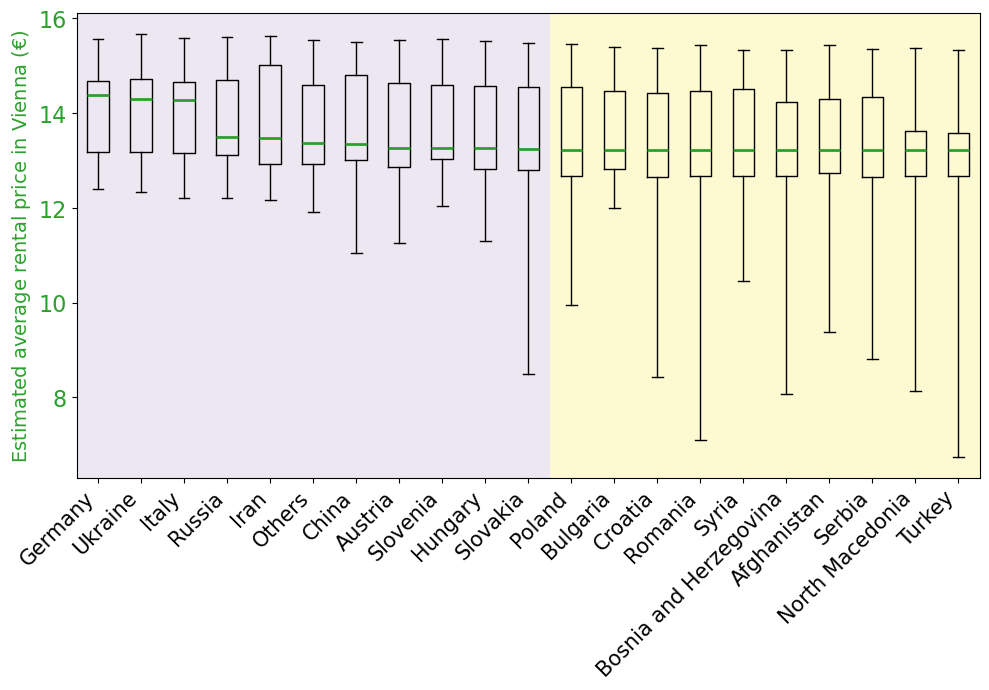

In [50]:
fig, ax1 = plt.subplots(figsize=(10, 7))
color = 'tab:green'
ax1.set_ylabel('Estimated average rental price in Vienna $(€)$', color=color , fontsize=14)
bp = ax1.bxp(box_dict_reg_tot)
ax1.set_xticks(np.arange(1, len(box_df_reg["label"]) + 1))
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=15)
ax1.tick_params(axis='y', labelcolor=color, labelsize=16)  # Adjust fontsize for y-axis ticks

# Change the color of median line in boxplots to match the y-axis color
for element in ['medians']:
    plt.setp(bp[element], color=color, linewidth=2)

# Define the viridis colormap
viridis_colormap = cm.get_cmap('viridis')
# Choose specific values in the viridis colormap for purples and yellows
purple_color = viridis_colormap(0.08)
yellow_color = viridis_colormap(0.99)

# Get the y-limits of the plot
y_min, y_max = ax1.get_ylim()

# Draw dashed rectangles spanning the height of the plot
rect1 = Rectangle((0.4, y_min-0.1), 11.1, y_max-y_min+0.2, fill=True, facecolor=purple_color, lw=5, alpha=0.1)
rect2 = Rectangle((len(box_df_reg["label"]) - 9.5, y_min-0.1), 10.15, y_max-y_min+0.2, fill=True, facecolor=yellow_color, lw=5, alpha=0.2)
ax1.add_patch(rect1)
ax1.add_patch(rect2)

fig.tight_layout()
plt.savefig("Figures/SI/S9c.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

In [51]:
fraction_income=fraction_income.sort_values("AVERAGE/M²",ascending=True)
fraction_income["QuartileRental"] = pd.qcut(fraction_income["AVERAGE/M²"], 4)
sum_df_rental = pd.DataFrame(columns=['Q1','Q2','Q3','Q4','med'])
for column_name, column_values in fraction_income[range_column_names_box].items():
     # Iterate over rows
    Q1=0
    Q2=0
    Q3=0
    Q4=0
    for index, value in column_values.items():
        if fraction_income.at[index, 'AVERAGE/M²'] <= 13.18:
            Q1+=value
        elif fraction_income.at[index, 'AVERAGE/M²'] > 13.18  and fraction_income.at[index, 'AVERAGE/M²'] <= 14.27:
            Q2+=value
        elif fraction_income.at[index, 'AVERAGE/M²'] > 14.27  and fraction_income.at[index, 'AVERAGE/M²'] <= 14.71:
            Q3+=value
        elif fraction_income.at[index, 'AVERAGE/M²'] > 14.71:
            Q4+=value

    sum_df_rental.at[column_name, 'Q1'] = Q1
    sum_df_rental.at[column_name, 'Q2'] = Q2
    sum_df_rental.at[column_name, 'Q3'] = Q3
    sum_df_rental.at[column_name, 'Q4'] = Q4
    sum_df_rental.at[column_name, 'med'] = Q1+Q2
    
sum_df_rental=sum_df_rental.sort_values("med", ascending=True)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\296724532.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\296724532.py:36: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.



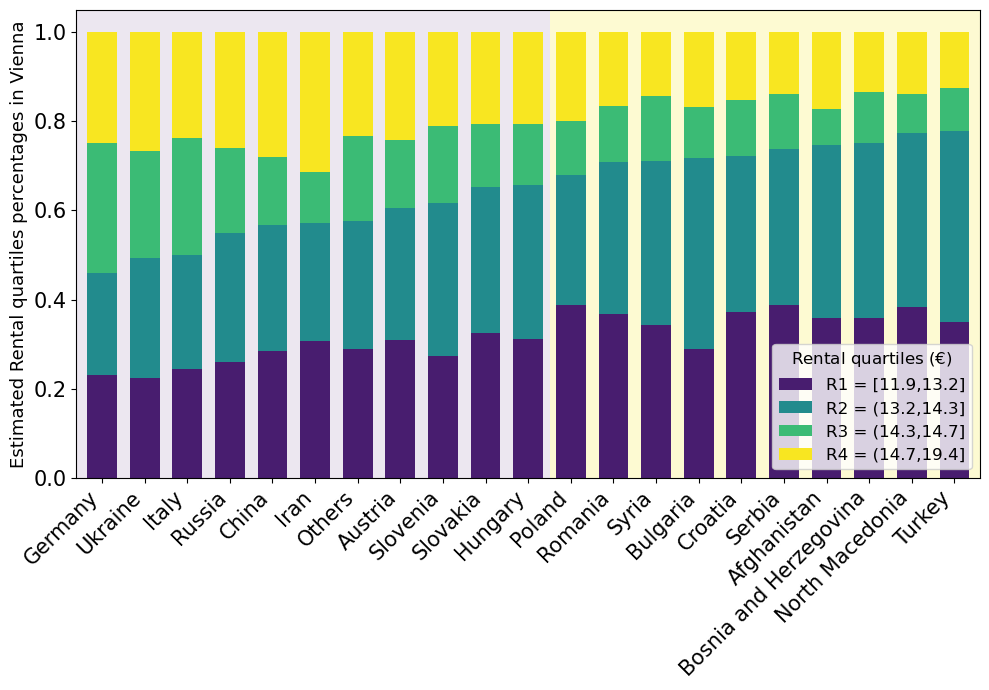

In [52]:
sum_df_rental=sum_df_rental.drop(columns='med')
# Define the viridis colormap
viridis_colormap = cm.get_cmap('viridis')
# Choose specific values in the viridis colormap for purples and yellows
purple_color = viridis_colormap(0.08)
blue_color = viridis_colormap(0.48)
green_color = viridis_colormap(0.68)
yellow_color = viridis_colormap(0.99)

fig, ax = plt.subplots(figsize=(10, 7))
sum_df_rental.plot(ax=ax, kind='bar', stacked=True, color=[purple_color, blue_color, green_color, yellow_color], width=0.7, align='center')
ax.set_ylabel('Estimated Rental quartiles percentages in Vienna',fontsize=13)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=15)
ax.tick_params(axis='both', labelsize=15) 

# Extract the data values
data_values = fraction_income["AVERAGE/M²"].values

# Calculate quantiles manually
quantiles = np.percentile(data_values, [0, 25, 50, 75, 100])  # Compute the quantile ranges (Q1-Q4)

# Customize the legend with manual quantile labels
legend = ax.get_legend()  # Get the original legend

# Custom labels for the quartiles
labels = [
    f"R1 = [{quantiles[0]:.1f},{quantiles[1]:.1f}]",
    f"R2 = ({quantiles[1]:.1f},{quantiles[2]:.1f}]",
    f"R3 = ({quantiles[2]:.1f},{quantiles[3]:.1f}]",
    f"R4 = ({quantiles[3]:.1f},{quantiles[4]:.1f}]"
]

# Replace the legend
legend.remove()
custom_legend = ax.legend(
    handles=legend.legendHandles,  # Reuse the original legend handles
    labels=labels,
    loc="lower right",  # Adjust position as needed
    title=r'Rental quartiles ($€$)',
    fontsize=12,  # Enlarge font size for legend text
    title_fontsize=12,  # Enlarge font size for legend title
    frameon=True,
)
# Get the y-limits of the plot
y_min, y_max = ax.get_ylim()

# Draw dashed rectangles spanning the height of the plot
rect1 = Rectangle((-0.65, y_min-0.1), 11.15, y_max-y_min+0.2, fill=True, facecolor=purple_color, lw=5, alpha=0.1, zorder=-1)
rect2 = Rectangle((len(sum_df_rental["Q1"]) - 10.5, y_min-0.1), 10.15, y_max-y_min+0.2, fill=True, facecolor=yellow_color, lw=5, alpha=0.2, zorder=-1)
ax.add_patch(rect1)
ax.add_patch(rect2)

fig.tight_layout()
plt.savefig("Figures/SI/S9d.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

### Figure 10
Relationship between Income and Rental price: A clustering approach

In [53]:
df=fraction_income[["AVERAGE/M²","AVERAGE_NETINCOME_TOTAL"]].copy()

In [54]:
# Range of K values to test
k_values = range(2, 11)  # Test K from 2 to 10 (adjust as needed)
silhouette_scores = []

for ks in k_values:
    kmeanssil = KMeans(n_clusters=ks, random_state=10, n_init="auto")
    kmeanssil.fit(df)
    labels = kmeanssil.labels_
    silhouette_avg_k = silhouette_score(df, labels)
    silhouette_scores.append(silhouette_avg_k)

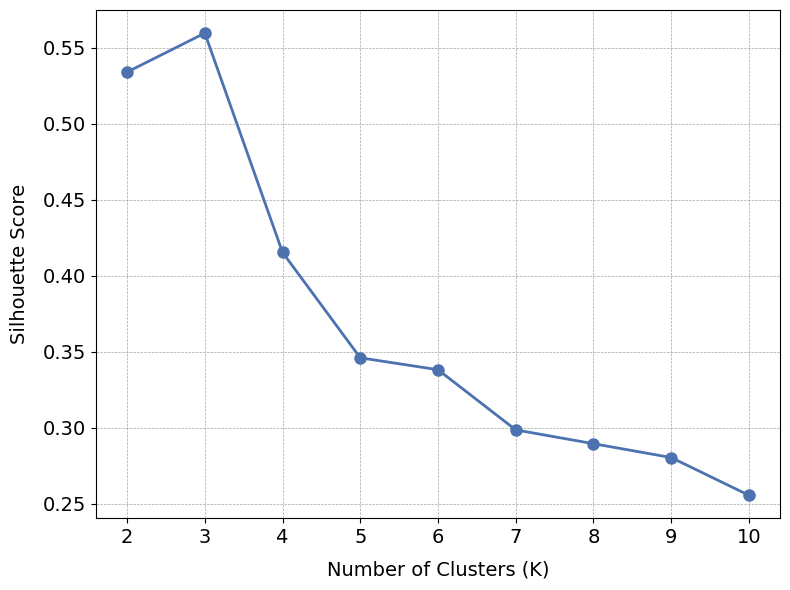

In [55]:
# Use a built-in clean style
plt.style.use('default')
# Create the plot
plt.figure(figsize=(8, 6))  # Larger figure for clarity
plt.plot(
    k_values, silhouette_scores,
    marker='o', linestyle='-', color='#4C72B0', linewidth=2, markersize=8
)

# Customize axis labels and title
plt.xlabel('Number of Clusters (K)', fontsize=14, labelpad=10)
plt.ylabel('Silhouette Score', fontsize=14, labelpad=10)

# Customize ticks
plt.xticks(k_values, fontsize=14)
plt.yticks(fontsize=14)

# Add grid
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)

# Tighten layout and display
plt.tight_layout()
plt.savefig("Figures/SI/S10a.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

In [56]:
# Choose the optimal number of clusters (K=3)
k = 3
# Create a K-Means model
kmeans = KMeans(n_clusters=k, random_state=10, n_init="auto")
# Fit the model to your data
kmeans.fit(df)

KMeans(n_clusters=3, n_init='auto', random_state=10)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\1277974073.py:7: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


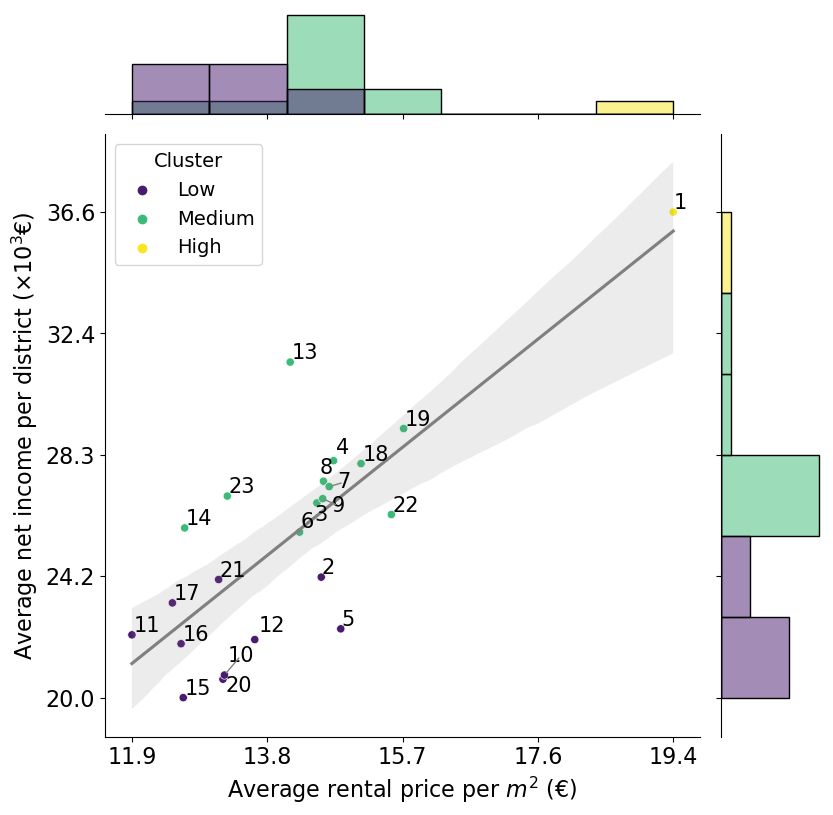

In [57]:
fraction_income["Cluster"]=kmeans.labels_
# Map Cluster values to custom labels
cluster_mapping = {1: 'Low', 0: 'Medium', 2: 'High'}
fraction_income['Cluster_Label'] = fraction_income['Cluster'].map(cluster_mapping)

# Define custom colors for the clusters
viridis_colormap = cm.get_cmap('viridis')
cluster_colors = {
    'Low': viridis_colormap(0.08),       # Purple for Low
    'Medium': viridis_colormap(0.68),   # Green for Medium
    'High': viridis_colormap(0.99)      # Yellow for High
}

# Create a JointGrid with larger figure size
g = sns.JointGrid(
    data=fraction_income,
    x="AVERAGE/M²",
    y="AVERAGE_NETINCOME_TOTAL",
    hue="Cluster_Label",
    height=8
)

# Add scatterplot to the JointGrid
g.plot_joint(
    sns.scatterplot,
    palette=cluster_colors
)

# Add histograms to the marginal axes with custom bins and colors
g.plot_marginals(
    sns.histplot,
    bins='auto',
    palette=cluster_colors
)

# Add a regression line to the scatterplot
sns.regplot(
    data=fraction_income,
    x="AVERAGE/M²",
    y="AVERAGE_NETINCOME_TOTAL",
    scatter=False,  # Don't duplicate scatter points
    ax=g.ax_joint,
    color="gray"
)

# Add Postal_Code annotations, avoiding overlaps
texts = []
for i, row in fraction_income.iterrows():
    texts.append(
        g.ax_joint.text(
            row['AVERAGE/M²'],  # Initial position
            row['AVERAGE_NETINCOME_TOTAL'],
            row['BEZNR'],
            fontsize=15,
            color="black"
        )
    )

# Adjust text to avoid overlaps
adjust_text(texts, ax=g.ax_joint, expand_text=(1.2, 1.4), arrowprops=dict(arrowstyle="-", color="gray"))

# Customize legend order
handles, labels = g.ax_joint.get_legend_handles_labels()
order = ['Low', 'Medium', 'High']
sorted_handles = [handles[labels.index(o)] for o in order]
g.ax_joint.legend(
    sorted_handles,
    order,
    title="Cluster",
    loc='upper left',
    fontsize=14,
    title_fontsize=14
)

# Customize axes labels
g.ax_joint.set_xlabel(r'Average rental price per $m^2$ ($€$)', fontsize=16)
g.ax_joint.set_ylabel(r'Average net income per district ($\times 10^3 €$)', fontsize=16)

# Set ticks on the axes
x_min, x_max = fraction_income['AVERAGE/M²'].min(), fraction_income['AVERAGE/M²'].max()
y_min, y_max = fraction_income['AVERAGE_NETINCOME_TOTAL'].min(), fraction_income['AVERAGE_NETINCOME_TOTAL'].max()

# Set custom ticks with one decimal
g.ax_joint.set_xticks(np.linspace(x_min, x_max, 5))  # 5 equidistant ticks
g.ax_joint.set_yticks(np.linspace(y_min, y_max, 5))
g.ax_joint.set_xticklabels([f"{x:.1f}" for x in np.linspace(x_min, x_max, 5)], fontsize=12)
g.ax_joint.set_yticklabels([f"{y:.1f}" for y in np.linspace(y_min, y_max, 5)], fontsize=12)

# Increase size of tick labels
g.ax_joint.tick_params(axis='both', which='major', labelsize=16)

# Tighten layout and display
fig.tight_layout()
plt.savefig("Figures/SI/S10b.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

In [58]:
sum_df_cluster = pd.DataFrame(columns=['Low','Medium','High'])
for column_name, column_values in fraction_income[range_column_names_box].items():
     # Iterate over rows
    Low=0
    Medium=0
    High=0
    for index, value in column_values.items():
        if fraction_income.at[index, 'Cluster_Label'] == "Low":
            Low+=value
        elif fraction_income.at[index, 'Cluster_Label'] == "Medium":
            Medium+=value
        elif fraction_income.at[index, 'Cluster_Label'] == "High":
            High+=value

    sum_df_cluster.at[column_name, 'Low'] = Low
    sum_df_cluster.at[column_name, 'Medium'] = Medium
    sum_df_cluster.at[column_name, 'High'] = High
    
sum_df_cluster=sum_df_cluster.sort_values("Low", ascending=True)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\1257008083.py:2: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\1257008083.py:28: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.



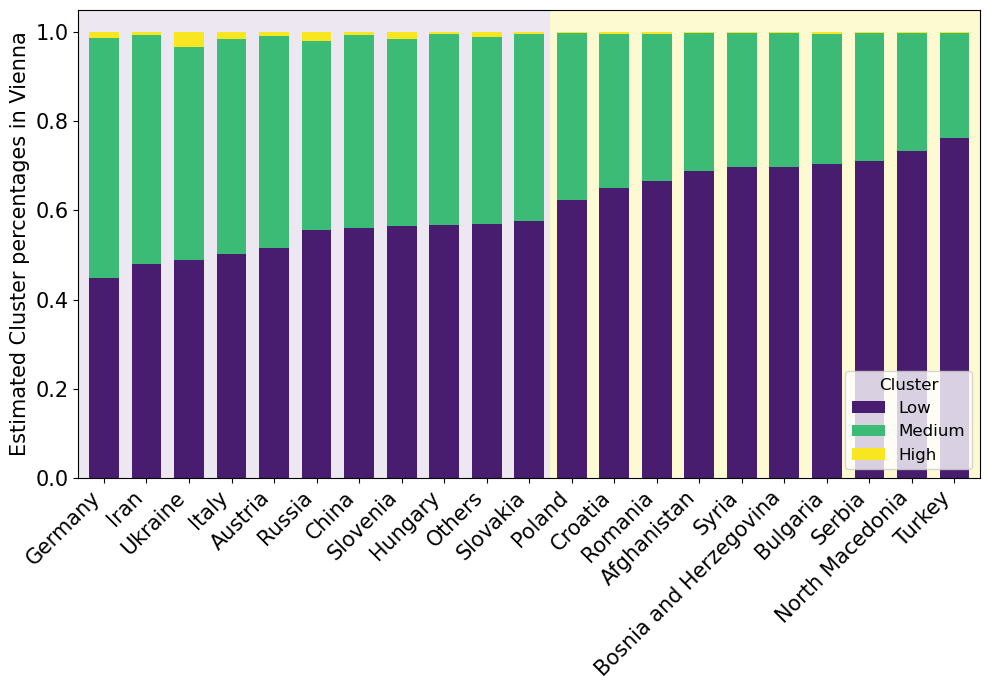

In [59]:
# Define the viridis colormap
viridis_colormap = cm.get_cmap('viridis')
# Reversed the order of the colors to match 'Low' -> purple, 'Medium' -> green, 'High' -> yellow
colors_label = [viridis_colormap(0.08), viridis_colormap(0.68), viridis_colormap(0.99)]
purple_color = viridis_colormap(0.08)
blue_color = viridis_colormap(0.48)
green_color = viridis_colormap(0.68)
yellow_color = viridis_colormap(0.99)

fig, ax = plt.subplots(figsize=(10, 7))
sum_df_cluster.plot(ax=ax, kind='bar', stacked=True, color=colors_label, width=0.7, align='center')
ax.set_ylabel('Estimated Cluster percentages in Vienna',fontsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=15)
ax.tick_params(axis='both', labelsize=15) 

# Extract the data values
data_values = fraction_income['Cluster_Label'].values

# Customize the legend with manual quantile labels
legend = ax.get_legend()  # Get the original legend

# Custom labels for the quartiles
labels = ["Low","Medium","High"]

# Replace the legend
legend.remove()
custom_legend = ax.legend(
    handles=legend.legendHandles,  # Reuse the original legend handles
    labels=labels,
    loc="lower right",  # Adjust position as needed
    title="Cluster",
    fontsize=12,  # Enlarge font size for legend text
    title_fontsize=12,  # Enlarge font size for legend title
    frameon=True,
)
# Get the y-limits of the plot
y_min, y_max = ax.get_ylim()

# Draw dashed rectangles spanning the height of the plot
rect1 = Rectangle((-0.65, y_min-0.1), 11.15, y_max-y_min+0.2, fill=True, facecolor=purple_color, lw=5, alpha=0.1, zorder=-1)
rect2 = Rectangle((len(sum_df_cluster["Low"]) - 10.5, y_min-0.1), 10.15, y_max-y_min+0.2, fill=True, facecolor=yellow_color, lw=5, alpha=0.2, zorder=-1)
ax.add_patch(rect1)
ax.add_patch(rect2)

fig.tight_layout()
plt.savefig("Figures/SI/S10c.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

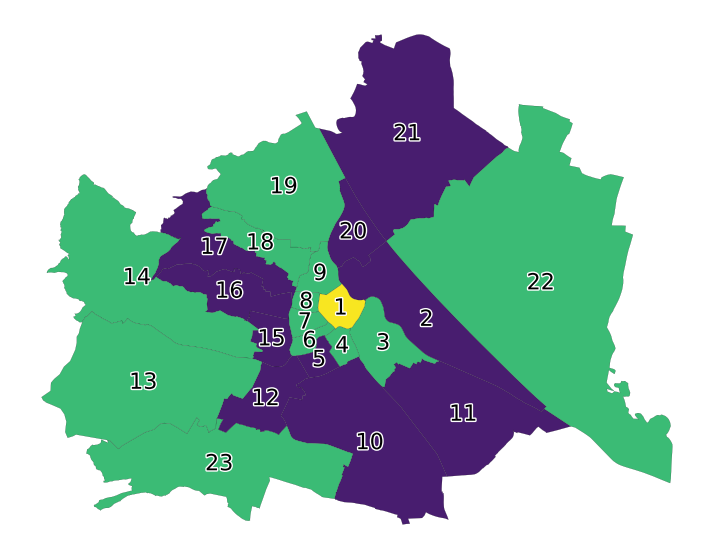

In [60]:
# Reversed the order of the colors to match 'Low' -> purple, 'Medium' -> green, 'High' -> yellow
colors_label = [viridis_colormap(0.08), viridis_colormap(0.68), viridis_colormap(0.99)]
scolors = [viridis_colormap(0.99),viridis_colormap(0.08), viridis_colormap(0.68)]
# Create a colormap
custom_cmap = ListedColormap(scolors)

# Extract the data values
data_values = fraction_income['Cluster_Label'].values

# Create a larger figure with a constant colorbar size
fig, ax = plt.subplots(figsize=(12, 7))  # Adjust the figsize values as needed

# Plotting the GeoPandas DataFrame using quantiles
cax = fraction_income.plot(
    'Cluster_Label', 
    legend=False, 
    edgecolor='black', 
    linewidth=0.1, 
    ax=ax, 
    cmap=custom_cmap,  # Set a colormap
)

# Remove the axes
ax.set_axis_off()

# Annotate each polygon with another column value (e.g., district number or name)
for idx, row in fraction_income.iterrows():
    centroid = row.geometry.centroid
    name = row['BEZNR']  # Replace 'BEZNR' with the actual column name representing the district name or number
    
    text = ax.text(
        centroid.x, centroid.y, name, 
        fontsize=16, ha='center', va='center', color='black'
    )
    
    # Add white outline to the text
    text.set_path_effects([
        PathEffects.withStroke(linewidth=2, foreground='white')
    ])

# Save the plot
plt.savefig("Figures/SI/S10d.pdf", bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()

### Figure 11
Correlations between key variables.

Correlation between diversity and Fraction of Migrants

In [61]:
vienna_simpson=pd.read_csv("Datasets/vienna_simpson.csv")
vienna_merged = vienna_simpson.merge(percentage, left_on="Postal_Code", right_index=True, how="inner")

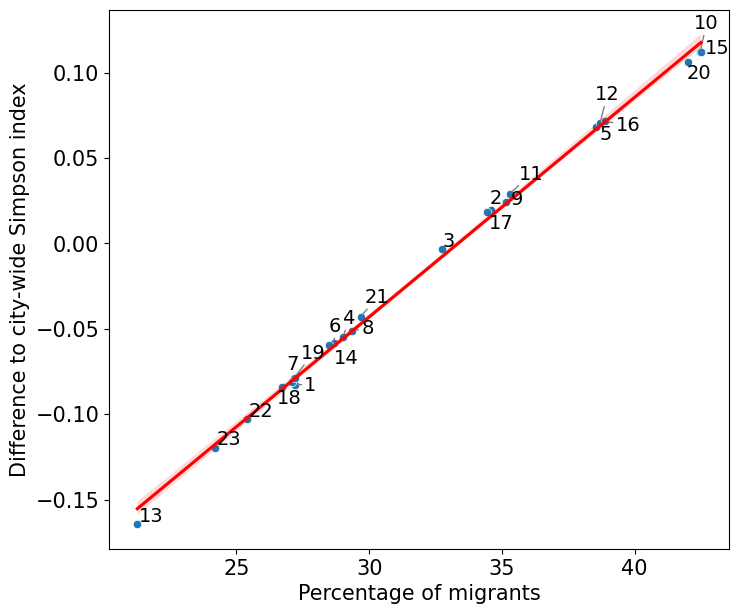

In [62]:
plt.figure(figsize=(8, 7))

# Using seaborn for scatter plot
sns.scatterplot(x=vienna_merged[percentage.name], y=vienna_merged["Simpson-citywide"])

# Optional: Add a line of best fit to see the correlation trend
sns.regplot(x=vienna_merged[percentage.name], y=vienna_merged["Simpson-citywide"], scatter=False, color="red")

#Prepare the text labels with a list of plt.text objects
texts = []
for i in range(vienna_merged.shape[0]):
    texts.append(plt.text(vienna_merged[percentage.name].iloc[i],
                          vienna_merged["Simpson-citywide"].iloc[i],
                          vienna_merged["BEZNR"].iloc[i],
                          fontsize=14, color='black'))

#Use adjust_text to automatically avoid overlaps
adjust_text(texts, arrowprops=dict(arrowstyle="-", color="gray"))

plt.tick_params(labelcolor='black', labelsize=15)  # Adjust fontsize for y-axis ticks

plt.xlabel("Percentage of migrants", fontsize=15)
plt.ylabel("Difference to city-wide Simpson index", fontsize=15)
plt.savefig("Figures/SI/S11a.pdf", bbox_inches='tight', pad_inches=0.1)

# Show the plot
plt.show()

In [63]:
correlation, _ = stats.pearsonr(vienna_merged[percentage.name], vienna_merged["Simpson-citywide"])
n = len(vienna_merged)  # Number of data points

# Calculate the standard error of the Pearson correlation
SE_r = np.sqrt((1 - correlation**2) / (n - 2))

# Fisher transformation to compute the confidence interval
z = np.arctanh(correlation)  # Fisher transformation
SE_z = 1 / np.sqrt(n - 3)  # Standard error in z-space

# Compute the z-scores for the 95% confidence interval (1.96 corresponds to 95%)
z_lower = z - 1.96 * SE_z
z_upper = z + 1.96 * SE_z

# Inverse Fisher transformation to get back the confidence interval in r-space
r_lower = np.tanh(z_lower)
r_upper = np.tanh(z_upper)

print(f"Pearson correlation between Simpson-citywide and percentage: {correlation}")
print(f"Standard Error of correlation: {SE_r}")
print(f"95% confidence interval: [{r_lower}, {r_upper}]")

Pearson correlation between Simpson-citywide and percentage: 0.9989496107011514
Standard Error of correlation: 0.00999922682729612
95% confidence interval: [0.9974782246617182, 0.9995626717170548]


Correlation between income and Fraction of Migrants

In [64]:
vienna_income = fraction_income.merge(percentage, left_on="Postal_Code", right_index=True, how="inner")

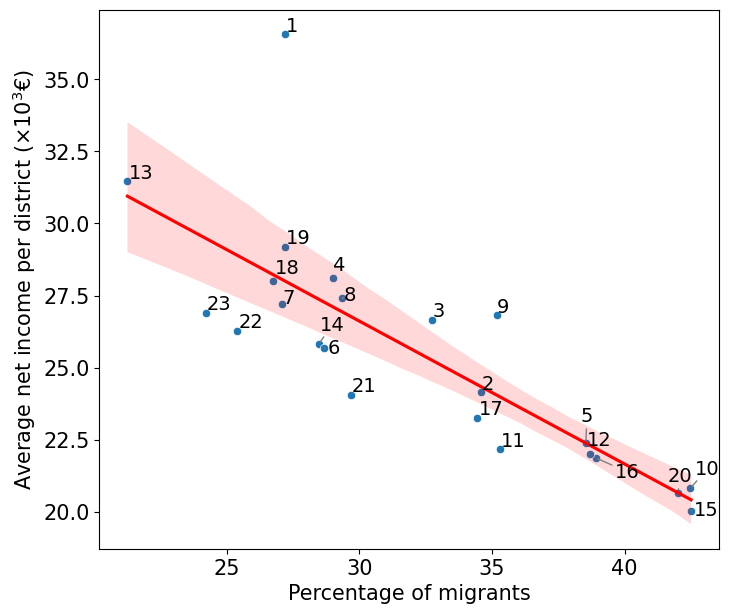

In [65]:
plt.figure(figsize=(8, 7))

# Using seaborn for scatter plot
sns.scatterplot(x=vienna_income["Total_Per_District_y"], y=vienna_income["AVERAGE_NETINCOME_TOTAL"])

# Optional: Add a line of best fit to see the correlation trend
sns.regplot(x=vienna_income["Total_Per_District_y"], y=vienna_income["AVERAGE_NETINCOME_TOTAL"], scatter=False, color="red")

# Prepare the text labels with a list of plt.text objects
texts = []
for i in range(vienna_income.shape[0]):
    texts.append(plt.text(vienna_income["Total_Per_District_y"].iloc[i],
                          vienna_income["AVERAGE_NETINCOME_TOTAL"].iloc[i],
                          vienna_income["BEZNR"].iloc[i],
                          fontsize=14, color='black'))

#Use adjust_text to automatically avoid overlaps
adjust_text(texts, arrowprops=dict(arrowstyle="-", color="gray"))
plt.tick_params(labelcolor='black', labelsize=15)  # Adjust fontsize for y-axis ticks

plt.xlabel("Percentage of migrants", fontsize=15)
plt.ylabel(r'Average net income per district ($\times 10^3 €$)', fontsize=15)
plt.savefig("Figures/SI/S11b.pdf", bbox_inches='tight', pad_inches=0.1)

# Show the plot
plt.show()

In [66]:
# Compute the Pearson correlation coefficient
correlation, _ = stats.pearsonr(vienna_income["Total_Per_District_y"], vienna_income["AVERAGE_NETINCOME_TOTAL"])
n = len(vienna_income)  # Number of data points

# Calculate the standard error of the Pearson correlation
SE_r = np.sqrt((1 - correlation**2) / (n - 2))

# Fisher transformation to compute the confidence interval
z = np.arctanh(correlation)  # Fisher transformation
SE_z = 1 / np.sqrt(n - 3)  # Standard error in z-space

# Compute the z-scores for the 95% confidence interval (1.96 corresponds to 95%)
z_lower = z - 1.96 * SE_z
z_upper = z + 1.96 * SE_z

# Inverse Fisher transformation to get back the confidence interval in r-space
r_lower = np.tanh(z_lower)
r_upper = np.tanh(z_upper)

print(f"Pearson correlation: {correlation}")
print(f"Standard Error of correlation: {SE_r}")
print(f"95% confidence interval: [{r_lower}, {r_upper}]")

Pearson correlation: -0.7999461567313073
Standard Error of correlation: 0.13094639876333455
95% confidence interval: [-0.9115695974044336, -0.5784921177277349]


Correlation between Rental prices and Fraction of Migrants

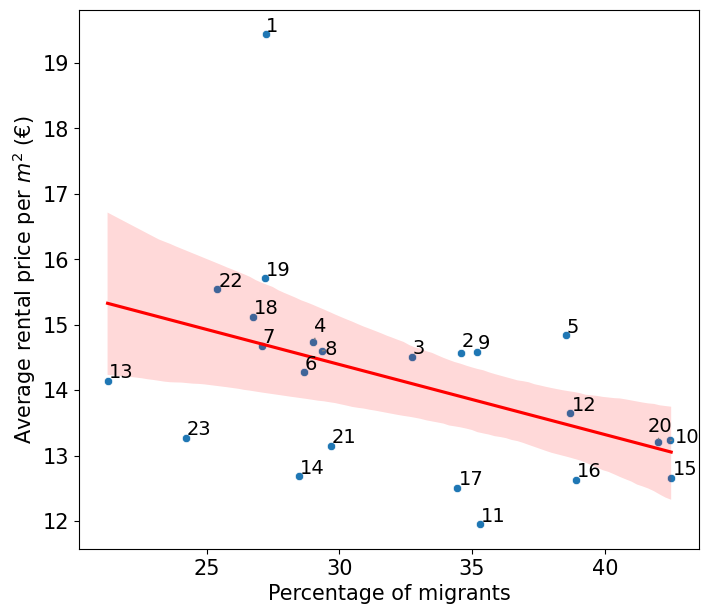

In [67]:
# Plot the scatter plot
plt.figure(figsize=(8, 7))

# Using seaborn for scatter plot
sns.scatterplot(x=vienna_income["Total_Per_District_y"], y=vienna_income["AVERAGE/M²"])

# Optional: Add a line of best fit to see the correlation trend
sns.regplot(x=vienna_income["Total_Per_District_y"], y=vienna_income["AVERAGE/M²"], scatter=False, color="red")

# Prepare the text labels with a list of plt.text objects
texts = []
for i in range(vienna_income.shape[0]):
    texts.append(plt.text(vienna_income["Total_Per_District_y"].iloc[i],
                          vienna_income["AVERAGE/M²"].iloc[i],
                          vienna_income["BEZNR"].iloc[i],
                          fontsize=14, color='black'))

# Use adjust_text to automatically avoid overlaps
adjust_text(texts, arrowprops=dict(arrowstyle="-", color="gray"))
plt.tick_params(labelcolor='black', labelsize=15)  # Adjust fontsize for y-axis ticks

plt.xlabel("Percentage of migrants", fontsize=15)
plt.ylabel(r'Average rental price per $m^2$ ($€$)', fontsize=15)
plt.savefig("Figures/SI/S11c.pdf", bbox_inches='tight', pad_inches=0.1)

# Show the plot
plt.show()

In [68]:
# Compute the Pearson correlation coefficient
correlation, _ = stats.pearsonr(vienna_income["Total_Per_District_y"], vienna_income["AVERAGE/M²"])
n = len(vienna_income)  # Number of data points

# Calculate the standard error of the Pearson correlation
SE_r = np.sqrt((1 - correlation**2) / (n - 2))

# Fisher transformation to compute the confidence interval
z = np.arctanh(correlation)  # Fisher transformation
SE_z = 1 / np.sqrt(n - 3)  # Standard error in z-space

# Compute the z-scores for the 95% confidence interval (1.96 corresponds to 95%)
z_lower = z - 1.96 * SE_z
z_upper = z + 1.96 * SE_z

# Inverse Fisher transformation to get back the confidence interval in r-space
r_lower = np.tanh(z_lower)
r_upper = np.tanh(z_upper)

print(f"Pearson correlation: {correlation}")
print(f"Standard Error of correlation: {SE_r}")
print(f"95% confidence interval: [{r_lower}, {r_upper}]")

Pearson correlation: -0.4287182662507945
Standard Error of correlation: 0.19714638604985804
95% confidence interval: [-0.7146356636745198, -0.020053243704317877]


### Figure 12
District diversity and national homophily in Vienna using Entropy and Gini indeces.

Entropy index

In [69]:
def entropy(group):
    total_per_country = group.groupby("Country_Name").Total_Per_District.sum()
    total_district = sum(total_per_country)
    entropy_district=0
    for i in total_per_country:
        entropy_district+=-(i/total_district)*np.log(i/total_district)
    return entropy_district, total_district

In [70]:
# Create an empty DataFrame to store the results
result_df = pd.DataFrame(columns=["Postal_Code", "Entropy", "weighted_average"])
total_migrants_Vienna = migrants_austrians.Total_Per_District.sum()
grouped = migrants_austrians.groupby("Postal_Code")
for postal_code, group in grouped:
    result, total = entropy(group)
    result2=result*(total/total_migrants_Vienna)
    df_new_row = pd.DataFrame({'Postal_Code': [postal_code], 'Entropy': [result], 'weighted_average': [result2]})
    result_df = pd.concat([result_df, df_new_row])

In [71]:
#Hbar is the weighted average of the parcel-specific diversity.
hbar=result_df.weighted_average.sum()
df_grouped = migrants_austrians.groupby(["Country_Name"]).Total_Per_District.sum().sort_values(ascending = False)
percentage_country = df_grouped/Total_population
#Entropy for the city
hhut=0
for Country_Name, total in percentage_country.items():
    hhut+=-(total)*np.log(total)
result_df["Entropy-citywide"]=result_df["Entropy"]-hhut

In [72]:
result_df['District'] = result_df['Postal_Code'].astype(str).str[1:3]
result_df['District'] = result_df['District'].apply(lambda x: x[:2] if x[0] != '0' else x[1])
result_df=result_df.sort_values("Entropy", ascending=False)
h=(hhut-hbar)/hhut

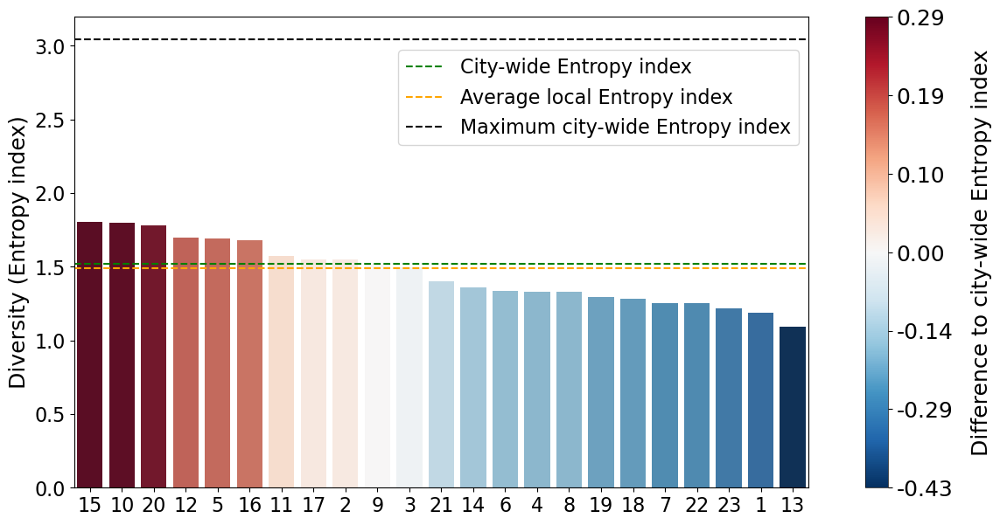

In [73]:
min_height=result_df["Entropy-citywide"].min()
max_height=result_df["Entropy-citywide"].max()
midpoint = 0  # Value at which white color will be centered
norm = colors.TwoSlopeNorm(vmin=min_height, vcenter=midpoint, vmax=max_height)
cmap = plt.colormaps.get_cmap('RdBu_r')
renormalized_heights = [norm(i) for i in result_df["Entropy-citywide"]]
bar_colors = [cmap(i) for i in renormalized_heights]

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(12, 7))

# Plot the bars using the diverging colormap
bars = sns.barplot(x="District", y="Entropy", data=result_df, ax=ax, ci=None, palette=bar_colors, order=result_df.sort_values('Entropy', ascending=False)['District'])
# Plot constant values as horizontal lines
ax.axhline(hhut, color='green', linestyle='--', label='City-wide Entropy index')
ax.axhline(hbar, color='orange', linestyle='--', label='Average local Entropy index')
max_entropy=np.log(21)
ax.axhline(max_entropy, color='black', linestyle='--', label='Maximum city-wide Entropy index')

# Customize the plot
ax.set_xlabel('')  # This removes the default x-axis label
ax.set_ylabel("Diversity (Entropy index)", fontsize=18)
# Increase the size of tick labels on both axes
ax.tick_params(axis='both', labelsize=16)  # Adjust labelsize as needed

divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='3%', pad=0.65)
colorbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap),
             cax=cax, orientation='vertical', label='Entropy-Citywide')
colorbar.ax.tick_params(labelsize=18)
colorbar.set_label('Difference to city-wide Entropy index', fontsize=18, labelpad=15)

# Set the number of ticks on the colorbar
midpoint=0
num_ticks = 3  # This gives you 2 positive ticks + 0 + 2 negative ticks
positive_ticks = np.linspace(midpoint, max_height, num=num_ticks+1)[1:]  # Exclude 0 for positive ticks
negative_ticks = np.linspace(min_height, midpoint, num=num_ticks+1)[:-1]  # Exclude 0 for negative ticks

# Concatenate negative ticks, zero, and positive ticks
tick_values = np.concatenate([negative_ticks, [midpoint], positive_ticks])    
tick_labels = [f'{tick:.2f}' for tick in tick_values]

colorbar.set_ticks(tick_values)
colorbar.set_ticklabels(tick_labels)
colorbar.outline.set_linewidth(0.5)  # Adjust the linewidth as needed

# Add a legend
ax.legend(loc='upper right', bbox_to_anchor=(1, 0.95), fontsize=16,facecolor='white')
plt.savefig("Figures/SI/S12a.pdf", bbox_inches='tight', pad_inches=0.1)
# Show the plot
plt.show()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5252\2790318562.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



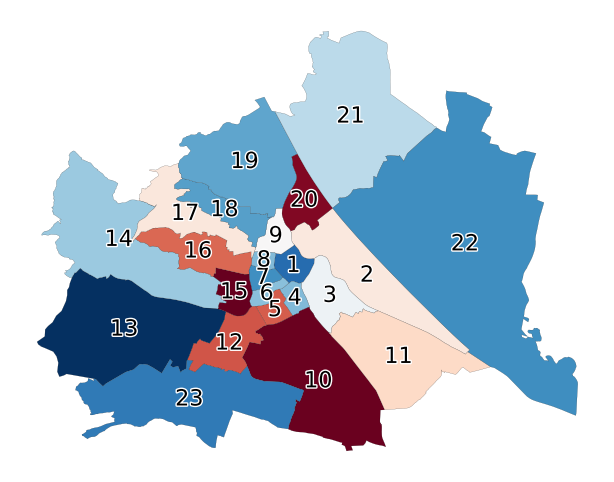

In [74]:
vienna["DISTRICT_CODE"] = vienna["DISTRICT_CODE"].astype(int)
result_df["Postal_Code"] = result_df["Postal_Code"].astype(int)

vienna_entropy = vienna.merge(result_df, left_on="DISTRICT_CODE", right_on="Postal_Code")
# Normalize data
min_height=result_df["Entropy-citywide"].min()
max_height=result_df["Entropy-citywide"].max()
midpoint = 0  # Value at which white color will be centered
norm = colors.TwoSlopeNorm(vmin=min_height, vcenter=midpoint, vmax=max_height)

# Choose a colormap
cmap = plt.cm.get_cmap('RdBu_r')

# Create a ScalarMappable to map normalized values to colors
mapper = ScalarMappable(norm=norm, cmap=cmap)

# Map colors to the normalized heights
bar_colors = [mapper.to_rgba(height) for height in result_df["Entropy-citywide"]]

# Create a larger figure with a constant colorbar size
fig, ax = plt.subplots(figsize=(12, 6))  # Adjust the figsize values as needed

# Plot the map with the larger figure
vienna_entropy.plot(column="Entropy-citywide", legend=False, cmap=cmap, norm=norm, ax=ax, edgecolor='black', linewidth=0.1, facecolor=bar_colors)

# Remove the axes
ax.set_axis_off()

# Annotate each polygon with another column value (e.g., district number or name)
for idx, row in vienna_entropy.iterrows():
    centroid = row.geometry.centroid
    name = row['BEZNR']  # Replace 'BEZNR' with the actual column name representing the district name or number
    
    text = ax.text(
        centroid.x, centroid.y, name, 
        fontsize=16, ha='center', va='center', color='black'  # Set text color to white
    )
    
    # Add black outline to the text
    text.set_path_effects([
        PathEffects.withStroke(linewidth=2, foreground='white')  # Black outline
    ])

plt.savefig("Figures/SI/S12b.pdf", bbox_inches='tight', pad_inches=0.1)

# Show the plot
plt.show()

Gini index

In [75]:
def gini_by_col(column):
    return inequality.gini.Gini(column.values).g

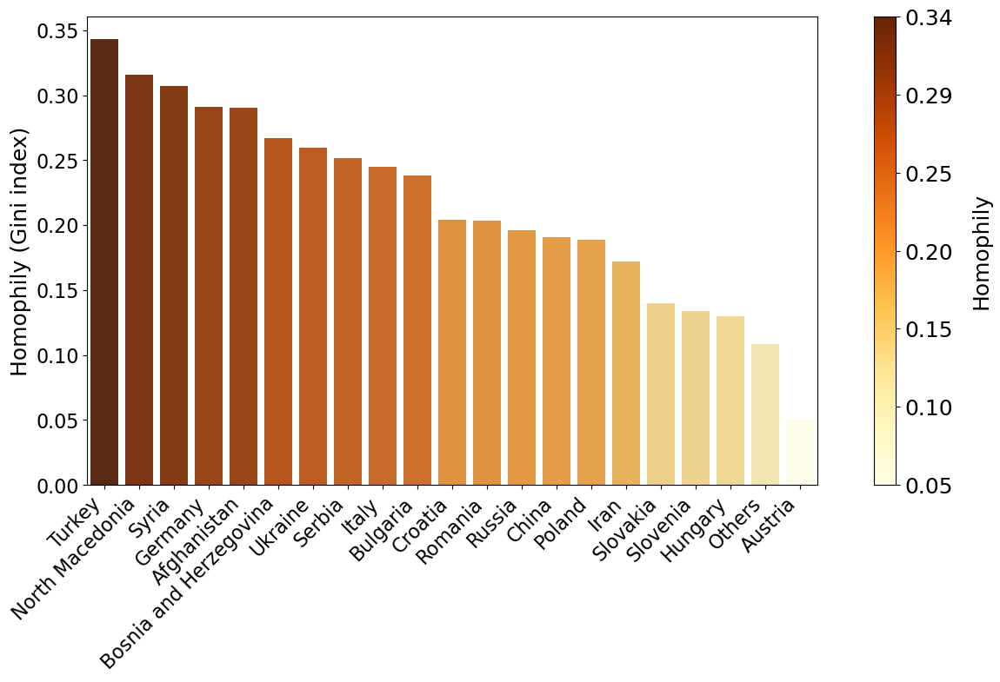

In [76]:
# Assuming the DataFrame is created as follows:
inequalities = (
    vienna_population2023[range_column_names_box].apply(gini_by_col, axis=0).to_frame("gini")
)

# Reset index and sort values for plotting
inequalities = inequalities.reset_index().rename(columns={'index': 'Country'})
inequalities = inequalities.sort_values(by='gini', ascending=False)

# Normalize Gini index for colormap
min_height = inequalities['gini'].min()
max_height = inequalities['gini'].max()
norm = colors.Normalize(vmin=min_height, vmax=max_height)

# Choose colormap
cmap = plt.colormaps.get_cmap('YlOrBr')
bar_colors = [cmap(norm(i)) for i in inequalities['gini']]

# Create plot
fig, ax = plt.subplots(figsize=(12, 7))

# Barplot
bars = sns.barplot(x='Country', y='gini', data=inequalities, ax=ax, palette=bar_colors)

# Customize plot
ax.set_xlabel('')  # Remove x-axis label
ax.set_ylabel("Homophily (Gini index)", fontsize=18)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.tick_params(axis='both', labelsize=16)

# Add colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='3%', pad=0.65)
colorbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cax, orientation='vertical', label="Gini Index")
colorbar.ax.tick_params(labelsize=18)
colorbar.set_label('Homophily', fontsize=18, labelpad=15)

# Format tick labels on colorbar
lin_ticks = np.linspace(min_height, max_height, num=7)
colorbar.set_ticks(lin_ticks)
colorbar.set_ticklabels([f"{tick:.2f}" for tick in lin_ticks])  # Format tick labels

# Save and show plot
plt.savefig("Figures/SI/S12c.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

C:\Users\Usuario\anaconda3\envs\data\lib\site-packages\geopandas\tools\clip.py:63: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`



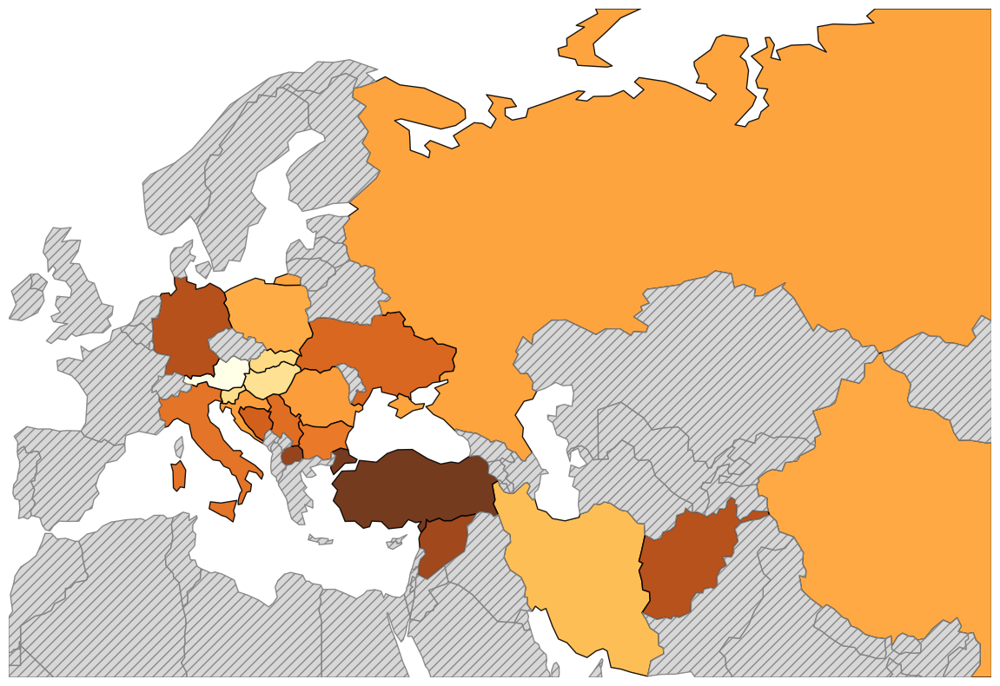

In [77]:
# Define a mapping of countries to categories
country_gini = {  
    'Turkey': 0.343331,
    'Germany': 0.290891,
    'Italy': 0.244577,
    'Bulgaria': 0.237910,
    'North Macedonia': 0.315941,
    'Syria': 0.307126,
    'Ukraine': 0.259717,
    'Bosnia and Herzegovina': 0.266856,
    'Republic of Serbia': 0.251777,
    'Afghanistan': 0.290038,
    'Croatia': 0.203865,
    'Iran': 0.171872,
    'China': 0.190862,
    'Austria': 0.050804,
    'Russia': 0.196246,
    'Romania': 0.203140,
    'Poland': 0.188417,
    'Slovenia': 0.133698,
    'Slovakia': 0.139534,
    'Hungary': 0.129764,
}

# Add a new 'Category' column based on the mapping
world['gini'] = world['sovereignt'].map(country_gini)

ax=world.clip([-10, 25, 100, 75]).plot(column="gini", norm=norm, cmap=cmap, edgecolor='black', legend=False, figsize=(15, 10), alpha=0.9, aspect=1.2, missing_kwds={
        "color": "lightgrey",
        "edgecolor": "grey",
        "hatch": "///",
        "label": "Irrelevant in our work",
    })
ax.set_axis_off();
ax.margins(0)
plt.savefig("Figures/SI/S12d.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()